# Remaining Useful Life Prediction
<br>

## Description

The purpose of this work is to perform an original approach to a pretictive maintenance issue. <br>
The data to be used is provided by The Prognostics Center of Excellence (PCoE) at NASA Ames. <br>
This dataset was used for the prognostics challenge competition at the International Conference on Prognostics and Health Management (PHM08). The challenge is still open for the researchers to develop and compare their efforts against the winners of the challenge in 2008. <br>

The link to the original description of the competition, as well as the source files and previous scores can be found here: <br> 
[PHM08 Challenge Data Set](https://ti.arc.nasa.gov/tech/dash/groups/pcoe/prognostic-data-repository/)

<br>

## Contextualization

The data sets consist of multiple multivariate time series. <br>
Each data set is further divided into training and test subsets. <br>
Each time series is from a different engine – i.e., the data can be considered to be from a fleet of engines of the same type. <br>
Each engine starts with different degrees of initial wear and manufacturing variation which is unknown to the user. This wear and variation is considered normal, i.e., it is not considered a fault condition. <br>
The engine is operating normally at the start of each time series, and starts to degrade at some point during the series. <br>
In the training set, the degradation grows in magnitude until a predefined threshold is reached beyond which it is not preferable to operate the engine. <br>
In the test set, the time series ends some time prior to complete degradation. <br>

Below we can see two symbolic figures that help us better understand the difference between the train and test sets.<br>

<img style="display:inline; margin-left:100px" width=75% src="figures/train_exemple.png"/>
<img style="display:inline; margin-left:100px" width=75% src="figures/test_exemple.png"/>

There are three operational settings that have a substantial effect on engine performance. These settings are also included in the data. The data are contaminated with sensor noise. <br> <br>
The objective of the competition was to predict the number of remaining operational cycles before in the test set, i.e., the number of operational cycles after the last cycle that the engine will continue to operate properly. <br>
Users are expected to train their algorithms using data in the file named train.txt. They must then evaluate the RUL prediction performance on data provided in file test.txt. Associated true RUL values are not being revealed just like in the competition. <br>
Users are able to use a web application to upload their results and get an aggregate score feedback. <br> <br>
A set of representative top 20 scores obtained during the competition are included here to provide a reference to everyone. <br> <br>
<img style="display:inline; margin-left:300px" width=15% src="figures/xcode.png"/> <br>

#### Evaluation
The final score is a weighted sum of RUL errors. The scoring function is an asymmetric function that penalizes late predictions more than the early predictions. Following equations describe this function analytically. <br>

<img style="display:inline; margin-left:50px" width=30% src="figures/formulas.png"/>
<img style="display:inline; margin-left:50px" width=40% src="figures/grafico_erro.png"/>

where,<br>
s is the computed score,<br>
n is the number of UUTs,<br>
d = (Estimated RUL – True RUL),<br>
a1 = 13, and a2 = 10.<br>

Source: https://ti.arc.nasa.gov/tech/dash/groups/pcoe/prognostic-data-repository/#phm08_challenge
<br><br><br>
From now on we will submit our data to some pre processing steps and then train some of the most common machine learning algorithms for regression problems. We can see the following diagram that summarizes all the steps in which the data is submitted to.
<br><br><br><br>
<img style="display:inline; margin-left:50px" width=75% src="figures/thesis_diagram.png"/> <br>

<br><br>

One last piece of information before we start the work is that the codes will be divided into three parts:

__Part 1: Original Training Set Processing.__
In this step we will use the train set available in the file *'train.txt'*. Assuming that if there is a perfect predictor data set, this is the one. So the statistic data we will further use to standarize and manipulate the other sets will be taken from this data.
banana
Performed Steps:
1. Pre working
2. Visualizations
3. Clustering
4. Standardization
5. Filtering
6. Dimensionality Reduction
7. LOG Transform
<br>

__Part 2: Artificial Training Set Processing.__
In this step we will create several artificial training tests from each original training test. Since the test set contains truncated data, which is components whose sensor trajectories do not reach the end of their lifetime, we will truncate the training set at random moments through a unit’s lifetime, well be able to make a dataset more similar to the one that our models will be evaluated on. We will get into more details soon.
Performed Steps:
8. Feature Extraction
9. Training and evaluation models
<br>

__Part 3: Test Set Processing.__
In this step we will only submit the test set contained in the file *'test.txt'* to all processing steps that was performed in part 2. Then we will submit the result to the algorithm that presented the best performace when evaluated on the training set. And finally get the predictions and submit upload it on NASA website to get our final score.
<br>
10. Official NASA score.

In [296]:
#Import Libraries

from IPython.display import HTML
import random
import numpy as np
import pandas as pd
import time

import matplotlib.pyplot as plt
from matplotlib import pyplot
import matplotlib as mpl
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.datasets import load_digits
from scipy.interpolate import interp1d
from scipy import stats
import statsmodels.api as sm

import tsfresh
from tsfresh import extract_relevant_features
from tsfresh.feature_extraction import extract_features
from tsfresh.feature_extraction import ComprehensiveFCParameters

import xgboost as xgb
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor

In [99]:
## FUNCTIONS

def hide(for_next=False):
    this_cell = """$('div.cell.code_cell.rendered.selected')"""
    next_cell = this_cell + '.next()'

    toggle_text = 'Show/Hide Code'  # text shown on toggle link
    target_cell = this_cell  # target cell to control with toggle
    js_hide_current = ''  # bit of JS to permanently hide code in current cell (only when toggling next cell)

    if for_next:
        target_cell = next_cell
        toggle_text += ' next cell'
        js_hide_current = this_cell + '.find("div.input").hide();'

    js_f_name = 'code_toggle_{}'.format(str(random.randint(1,2**64)))

    html = """
        <script>
            function {f_name}() {{
                {cell_selector}.find('div.input').toggle();
            }}

            {js_hide_current}
        </script>

        <a href="javascript:{f_name}()">{toggle_text}</a>
    """.format(
        f_name=js_f_name,
        cell_selector=target_cell,
        js_hide_current=js_hide_current, 
        toggle_text=toggle_text
    )

    return HTML(html)

def evaluation(predicted_rul, true_rul):
    #a1 = 13
    #a2 = 10
    negative = 0
    for i in range(0, len(predicted_rul)):
        if (predicted_rul[i] < 0):
            predicted_rul[i] = 0
            negative = negative + 1
    d = predicted_rul - true_rul    
    pred = pd.DataFrame(predicted_rul)
    true = pd.DataFrame(true_rul)
    result = pd.concat([true, pred], axis=1)
    result.columns = (['true', 'pred'])
    result['diff'] = result['true'] - result['pred']    
    score = 0
    for i in range(0, len(d)):
        if (d[i]<0):
            x = np.exp(-(d[i]/13))-1
        else:
            x = np.exp(d[i]/10)-1
        score = score + x
    score_per_test = score/len(predicted_rul)
    print('Negative predictions: ', negative)
    print('Score: ', score)
    print('AVG Score per test: ', score_per_test)    
    return(result)

def kmeans_assignment(centroids, points):
    num_centroids, dim = centroids.shape
    num_points, _ = points.shape

    # Reshape both arrays into `[num_points, num_centroids, dim]`
    centroids = np.tile(centroids, [num_points, 1]).reshape([num_points, num_centroids, dim])
    points = np.tile(points, [1, num_centroids]).reshape([num_points, num_centroids, dim])

    # Compute all distances (for all points and all centroids) at once and select the min centroid for each point
    distances = np.sum(np.square(centroids - points), axis=2)
    return np.argmin(distances, axis=1)

def kmeans_cluster(centroids, data):
    data = np.array(data)
    centroid_group = kmeans_assignment(centroids, data)
    centroid_group = pd.DataFrame(centroid_group)
    return(centroid_group)



def score_stats(prediction, real):
    prediction = pd.DataFrame(prediction)
    real = pd.DataFrame(real)
    result = pd.concat([real, prediction], axis=1)
    result.columns = (['Real', 'Predicted'])
    result = result.reset_index(drop=True)
    result['Diference'] = result['Predicted'] - result['Real']    
    negative = 0
    smaller = 0
    dif_sum = 0
    for i in range(0, len(result)):
        if (result['Predicted'][i] < 0):
            negative = negative + 1
        if (result['Diference'][i] < 0):
            smaller = smaller + 1
        x = abs(result['Real'][i]) - abs(result['Predicted'][i])
        dif_sum = dif_sum + x
    print('Negative predictions: ', negative)
    print('\nRUL Predictions smaller than True RUL: ', smaller)
    print('\n Sum of all differences betwen True and Predicted RULs: ', dif_sum)
    return(result)

hide()

## Step 1. Pre working

Let's load original data and see how does it looks like.

In [3]:
# Manage column's names.
dependent_var = ['RemainingUsefulLife']
index_columns_names =  ["UnitNumber","Cycle"]
operational_settings_columns_names = ["OpSet"+str(i) for i in range(1,4)]
sensor_measure_columns_names =["SensorMeasure"+str(i) for i in range(1,22)]
input_file_column_names = index_columns_names + operational_settings_columns_names + sensor_measure_columns_names


# Load original data file and input preconfigured column's names.
df_train = pd.read_csv('original_data/train.txt',delim_whitespace=True, names=input_file_column_names)
print('DATA SHAPE: ', df_train.shape)

DATA SHAPE:  (45918, 26)


Let's Create and assign the __"t_minus"__ column to the right of the original training data frame. This column refers to the decay of the RUL on each test, so it goes from: -SOME_VALUE to 0. Meaning that tests starts from different timestamps and degradation levels but end at the same time (or condition): RUL = 0. 

In [4]:
rul_unitno = [max(df_train.query('UnitNumber=='+str(i)).Cycle) for i in range(1,219)]
t_minus_temp = [df_train.query('UnitNumber=='+str(i)).Cycle.values-rul_unitno[i-1] for i in range(1,219)]
t_minus_list = [j for i in t_minus_temp for j in i]
df_train = df_train.assign(t_minus=t_minus_list)

Let's check data consistency.

In [5]:
print('IS THERE ANY MISSING VALUES?  ', df_train.isnull().values.any())

IS THERE ANY MISSING VALUES?   False


So let's take a look on how does our data looks like.

In [6]:
df_train.head(10)

,UnitNumber,Cycle,OpSet1,OpSet2,OpSet3,SensorMeasure1,SensorMeasure2,SensorMeasure3,SensorMeasure4,SensorMeasure5,...,SensorMeasure13,SensorMeasure14,SensorMeasure15,SensorMeasure16,SensorMeasure17,SensorMeasure18,SensorMeasure19,SensorMeasure20,SensorMeasure21,t_minus
0,1,1,10.0047,0.2501,20.0,489.05,604.13,1499.45,1309.95,10.52,...,2388.13,8120.83,8.6216,0.03,368,2319,100.0,28.58,17.1735,-222
1,1,2,0.0015,0.0003,100.0,518.67,642.13,1584.55,1403.96,14.62,...,2388.15,8132.87,8.3907,0.03,391,2388,100.0,38.99,23.3619,-221
2,1,3,34.9986,0.8401,60.0,449.44,555.42,1368.17,1122.49,5.48,...,2387.95,8063.84,9.3557,0.02,334,2223,100.0,14.83,8.8555,-220
3,1,4,20.0031,0.7005,0.0,491.19,607.03,1488.44,1249.18,9.35,...,2388.07,8052.30,9.2231,0.02,364,2324,100.0,24.42,14.7832,-219
4,1,5,42.0041,0.8405,40.0,445.00,549.52,1354.48,1124.32,3.91,...,2387.89,8083.67,9.2986,0.02,330,2212,100.0,10.99,6.4025,-218
5,1,6,20.0032,0.7017,0.0,491.19,607.37,1480.46,1258.90,9.35,...,2388.05,8053.17,9.2276,0.02,364,2324,100.0,24.44,14.7019,-217
6,1,7,41.9998,0.8400,40.0,445.00,549.57,1354.43,1131.44,3.91,...,2387.88,8082.01,9.3753,0.02,331,2212,100.0,10.53,6.4254,-216
7,1,8,0.0011,0.0000,100.0,518.67,642.08,1589.55,1407.59,14.62,...,2388.03,8133.29,8.4339,0.03,391,2388,100.0,38.98,23.2337,-215
8,1,9,0.0011,0.0020,100.0,518.67,642.70,1586.18,1399.01,14.62,...,2388.08,8132.72,8.3922,0.03,392,2388,100.0,38.99,23.2412,-214
9,1,10,42.0066,0.8400,40.0,445.00,549.83,1353.19,1125.09,3.91,...,2387.91,8085.94,9.3667,0.02,330,2212,100.0,10.75,6.4268,-213


Displaying some simple statistics

In [71]:
df_train.describe()

,UnitNumber,Cycle,OpSet1,OpSet2,OpSet3,SensorMeasure1,SensorMeasure2,SensorMeasure3,SensorMeasure4,SensorMeasure5,...,SensorMeasure13,SensorMeasure14,SensorMeasure15,SensorMeasure16,SensorMeasure17,SensorMeasure18,SensorMeasure19,SensorMeasure20,SensorMeasure21,t_minus
count,45918.000000,45918.000000,45918.000000,45918.000000,45918.000000,45918.000000,45918.000000,45918.000000,45918.000000,45918.000000,...,45918.000000,45918.000000,45918.000000,45918.000000,45918.000000,45918.000000,45918.000000,45918.000000,45918.000000,45918.000000
mean,109.396511,110.307396,24.008881,0.571251,49.172438,472.861677,579.596770,1419.947816,1205.669194,8.029878,...,2334.185381,8065.548831,9.332433,0.023354,348.293915,2228.342654,97.741699,20.776822,12.466282,-109.307396
std,62.866193,68.420545,14.793676,0.310935,32.503659,26.460179,37.391068,106.286960,119.550936,3.627125,...,128.426495,84.964099,0.751834,0.004722,27.837602,145.693883,5.378969,9.903697,5.941954,68.420545
min,1.000000,1.000000,0.000000,0.000000,0.000000,445.000000,535.650000,1245.430000,1029.490000,3.910000,...,2027.720000,7851.590000,8.325300,0.020000,303.000000,1915.000000,84.930000,10.230000,6.126600,-356.000000
25%,54.000000,53.000000,10.004500,0.250600,20.000000,445.000000,549.580000,1352.910000,1124.010000,3.910000,...,2387.880000,8061.230000,8.676925,0.020000,331.000000,2212.000000,100.000000,10.840000,6.504600,-159.000000
50%,110.000000,106.000000,25.001500,0.700000,40.000000,462.540000,555.985000,1369.140000,1138.870000,7.050000,...,2388.070000,8081.475000,9.314500,0.020000,335.000000,2223.000000,100.000000,14.870000,8.925200,-105.000000
75%,164.000000,160.000000,41.998100,0.840000,80.000000,491.190000,607.370000,1499.697500,1307.437500,10.520000,...,2388.160000,8126.380000,9.390000,0.030000,369.000000,2324.000000,100.000000,28.470000,17.084200,-52.000000
max,218.000000,357.000000,42.008000,0.842000,100.000000,518.670000,644.430000,1614.660000,1442.360000,14.620000,...,2390.740000,8274.880000,11.082600,0.030000,398.000000,2388.000000,100.000000,39.330000,23.590500,0.000000


## Step 2. Visualizations

Alright, our data is ready for work. Let's start with the sensors visualization. For the plot below, consider some points:
- Vertical axis: sensor readings values;<br>
- Horizontal axis: RUL (contained on "t_minus" columns);<br>
- All tests are displayed per sensor.

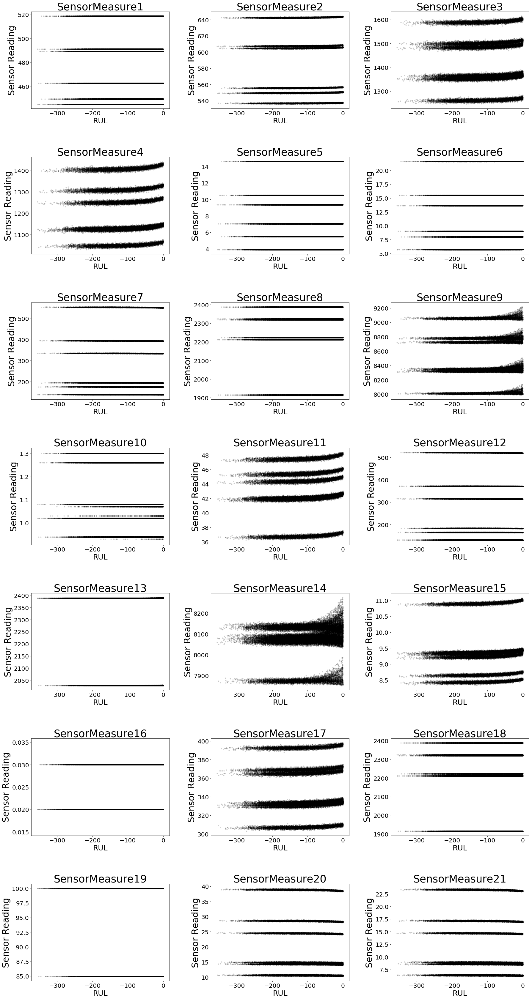

In [72]:
fig,ax=plt.subplots(7,3,figsize=(30,60))
c=0
for i in range(0,7):
    for j in range(0,3):
        plt.subplots_adjust(wspace=0.3, hspace=0.5)
        ax[i,j].scatter(df_train['t_minus'], df_train['SensorMeasure'+str(c+1)],s=10,alpha=0.15, color='black')
        ax[i,j].set_title('SensorMeasure'+str(c+1), fontsize = 35)
        ax[i,j].set_xlabel("RUL", fontsize = 25)
        ax[i,j].set_ylabel("Sensor Reading", fontsize = 30)
        ax[i,j].tick_params(axis='both', labelsize=20)
        c+=1
hide()

Looking at these plots superficially we can already infer some information:
1. Data distribution exhibits separate behaviors and this is visible on all sensors. The separations are very clear, but this plot is not enough to understand why this happens.
2. In most sensors data distribution tends to show characteristic disturbances as samples approach the end of the test.
3. There are some sensors that seem to be useless, we will consider discarding them in the future.

We really need to understand why this separation behavior in data distribution happens, but for now let's continue the visualizations and take a look on how correlated are the sensors with each other.

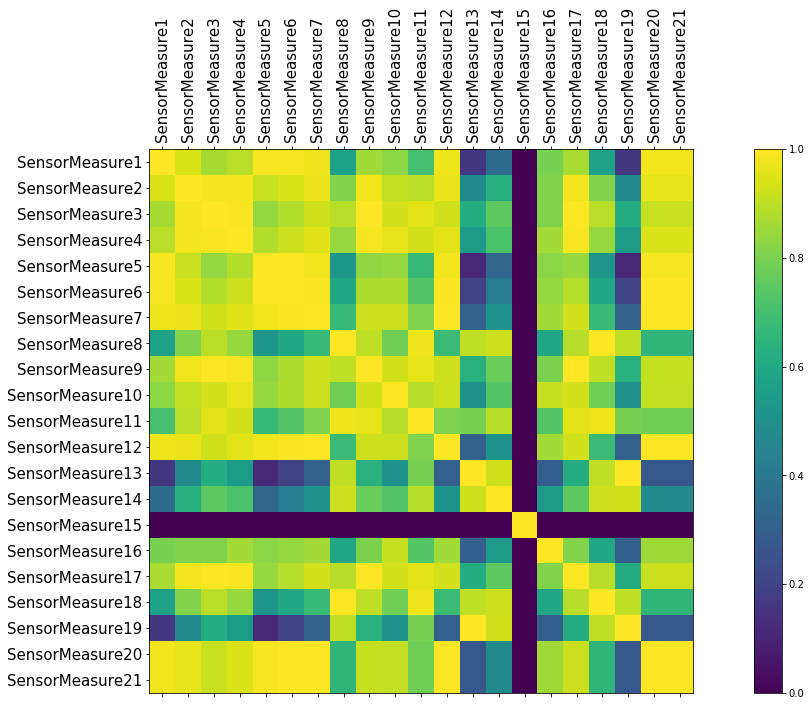

In [73]:
correlations = df_train.iloc[:,5:26].corr()
# Plot
fig = plt.figure(figsize=(22,10))
ax = fig.add_subplot(111)
cax = ax.matshow(correlations, vmin=0, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(df_train.iloc[:,5:26].columns),1)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
plt.xticks(rotation=90)
ax.set_xticklabels(df_train.iloc[:,5:26], fontsize=15)
ax.set_yticklabels(df_train.iloc[:,5:26], fontsize=15)
plt.show()
hide()

Looking at the plot above we notice that the yellow color predominates over the rest. This means that the sensors are closely correlated. We see specific non-standard behaviors, such as sensor 15, but in general this graph doesn't tell us much. It may be early to use it, especially with the untreated data.

Let's move on and see how does our operation condition looks like.
Note that the horizontal axis here is the operation time (number of cycles). There is no reason to use the "t_minus" column in this plot since operation conditions are independent external variables, so it makes no sense to view them in relation to degradation.

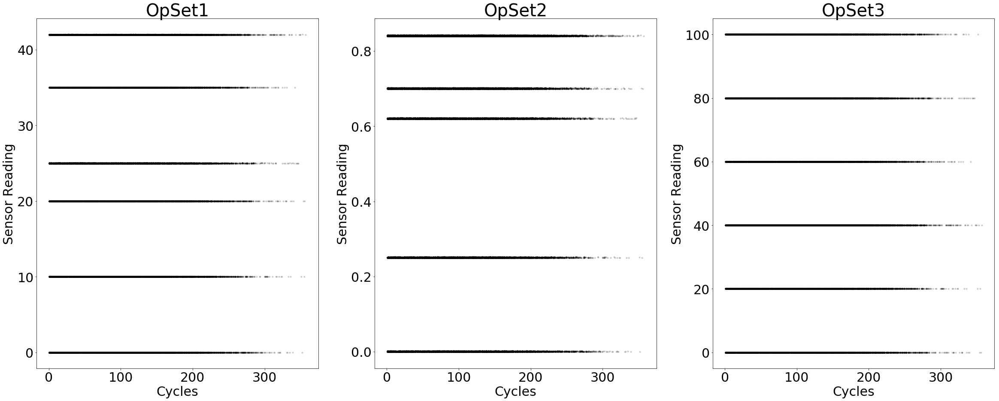

In [74]:
## Let's plot the operation set by the number of cycles

fig,ax=plt.subplots(1,3,figsize=(40,15))#,sharex=True)
c=0
for i in range(0,3):
    ax[i].scatter(df_train['Cycle'], df_train['OpSet'+str(c+1)],s=10,alpha=0.15, color='black')
    ax[i].set_title('OpSet'+str(c+1), fontsize = 40)
    ax[i].set_xlabel("Cycles", fontsize = 30)
    ax[i].set_ylabel("Sensor Reading", fontsize = 30)
    ax[i].tick_params(axis='both', labelsize=30)
    c+=1
hide()

We can see that operation conditions also have a relatively clear separation between their data distribution, but it is not yet possible to identify why that happens with this plot.<br>
Let's take advantage from the fact that we just have 3 operation settings and generate a 3D visualization.

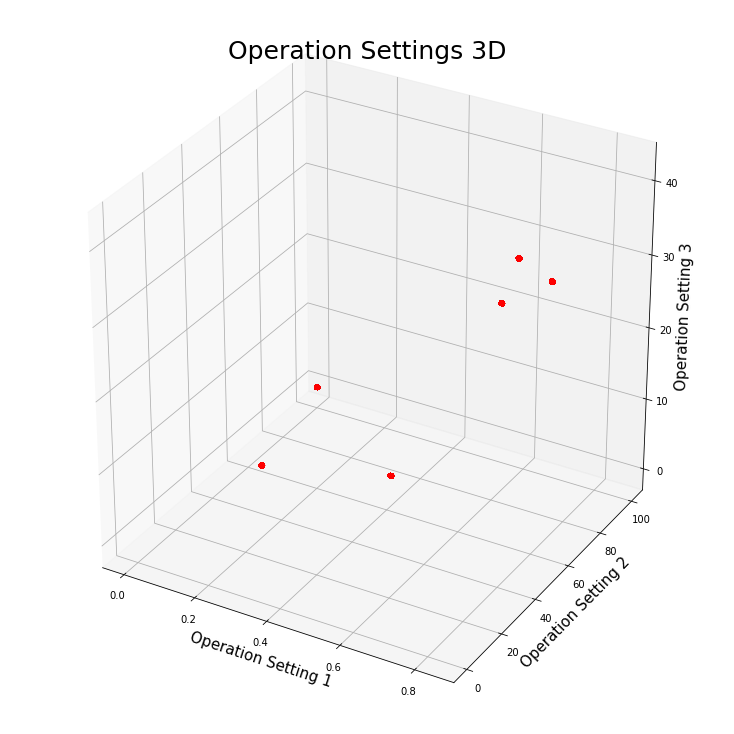

In [75]:
fig = pyplot.figure(figsize=(10,10))
ax = Axes3D(fig)
ax.set_title('Operation Settings 3D', fontsize = 25)
ax.set_xlabel('Operation Setting 1', fontsize = 15)
ax.set_ylabel('Operation Setting 2', fontsize = 15)
ax.set_zlabel('Operation Setting 3', fontsize = 15)

ax.scatter(df_train['OpSet2'], df_train['OpSet3'], df_train['OpSet1'], c='red')
pyplot.show()
hide()

# Step 3. Clustering

By superficially looking after this plot, we can see that the operation settings are grouped into 6 groups. We still don't know if it means something but it's a bait that definitely deserves a shot.

Since at this point we are dealing with unlabeled data and our goal is to identify patterns, we are dealing with an unsupervised learning problem.

We'll apply K-Means algorithm to cluster the data.

Although we can see from the 3D view that data is visibly distributed in 6 clusters, we will get a mathematical foundation before passing the number of clusters as a parameter to K-Means algorithm.

For this we will use a technique called __Silhouette Analysis__.
Through this technique, the data distribution is inpputed into a cluster algorithm that performs tests for different number of clusters and returns the score for each one.
Scores on this case goes from 0 (worst possible) to 1 (best possible).

For the sake of data processing hardware limits let's test clusters that range from 2 to 9.

For n_clusters = 2 The average silhouette_score is : 0.5777667217847624
For n_clusters = 3 The average silhouette_score is : 0.7228561018284831
For n_clusters = 4 The average silhouette_score is : 0.7882728525424852
For n_clusters = 5 The average silhouette_score is : 0.9194220366343638
For n_clusters = 6 The average silhouette_score is : 0.9998558910028272
For n_clusters = 7 The average silhouette_score is : 0.8940266135519652
For n_clusters = 8 The average silhouette_score is : 0.8307691370710419
For n_clusters = 9 The average silhouette_score is : 0.7700881538862213


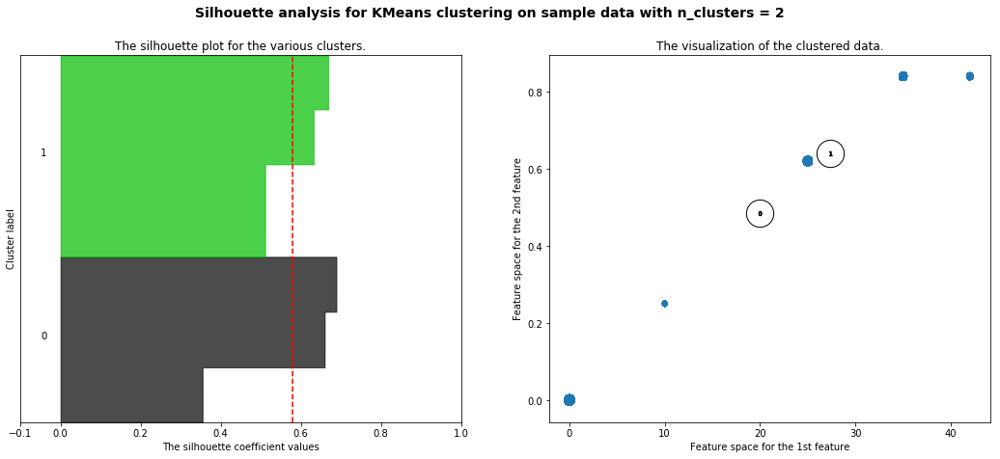

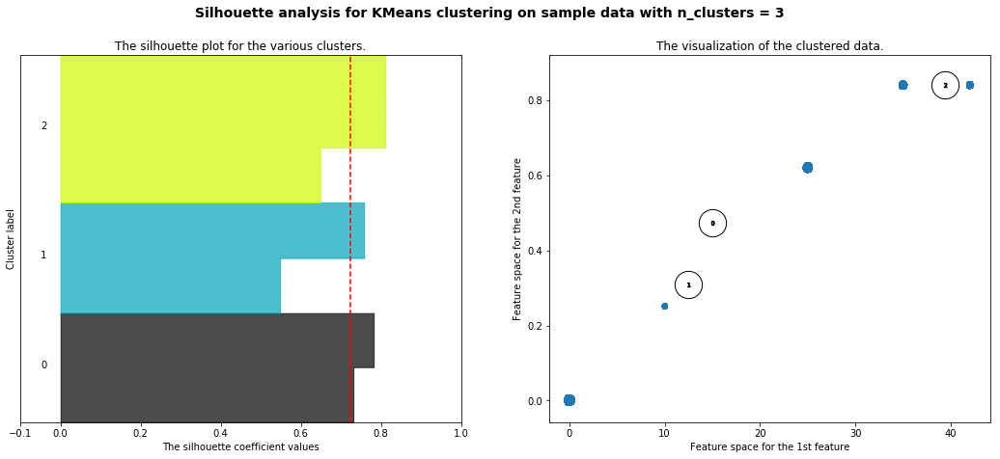

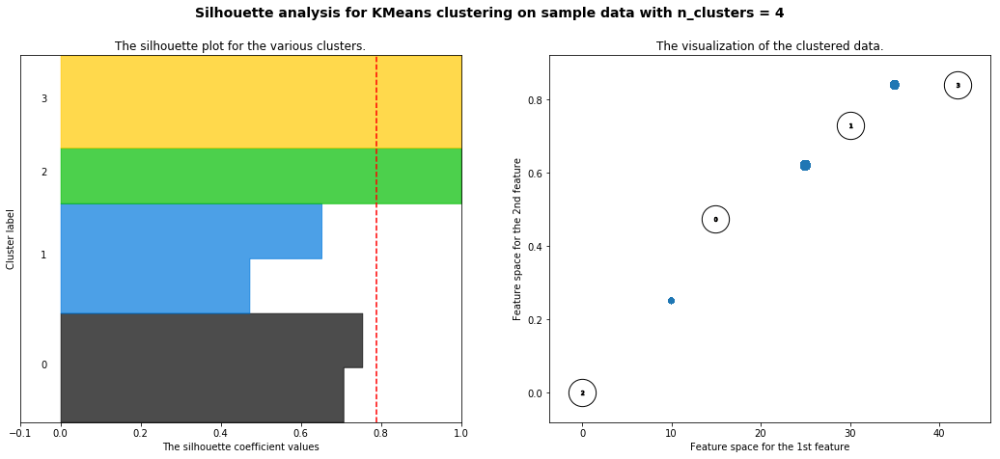

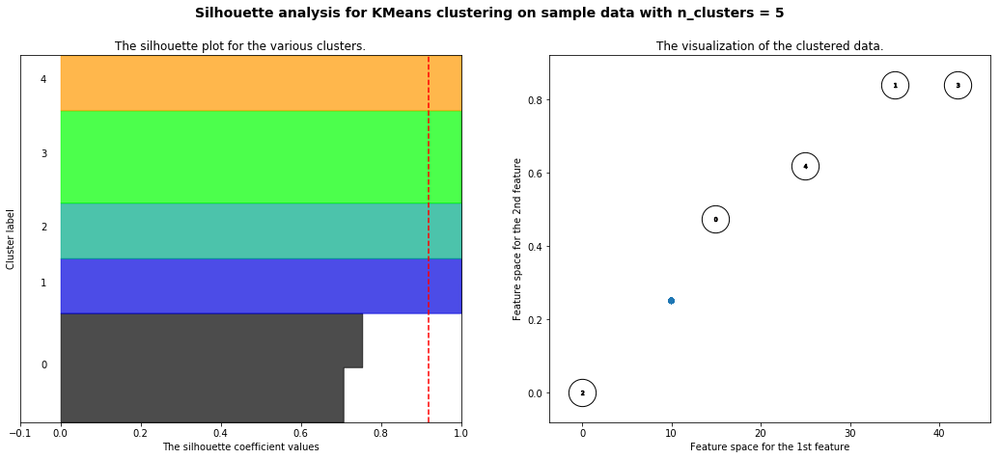

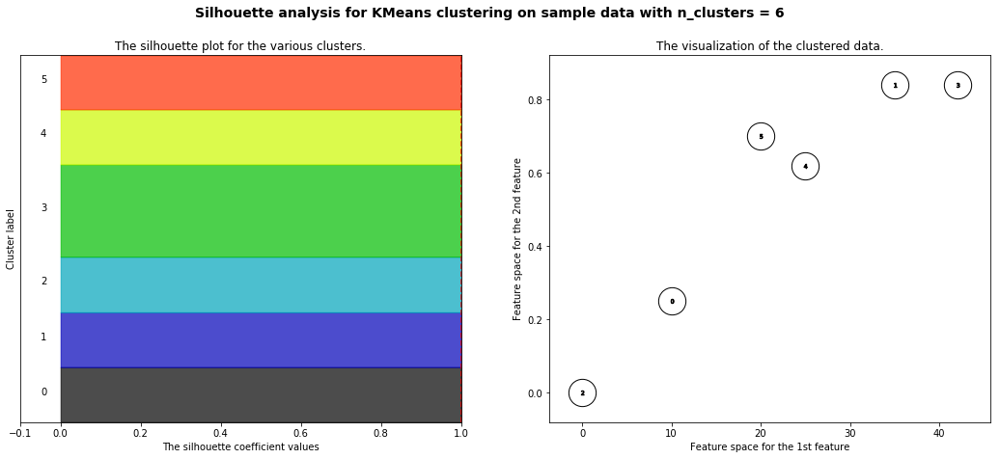

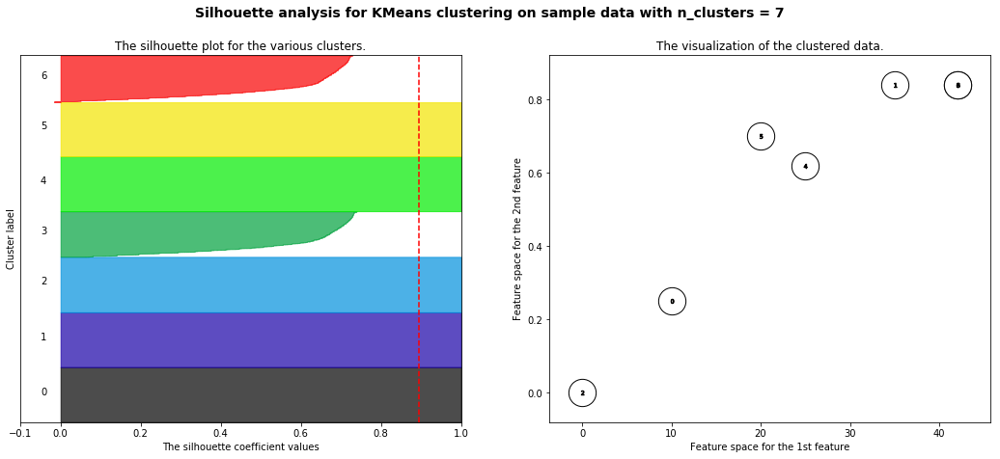

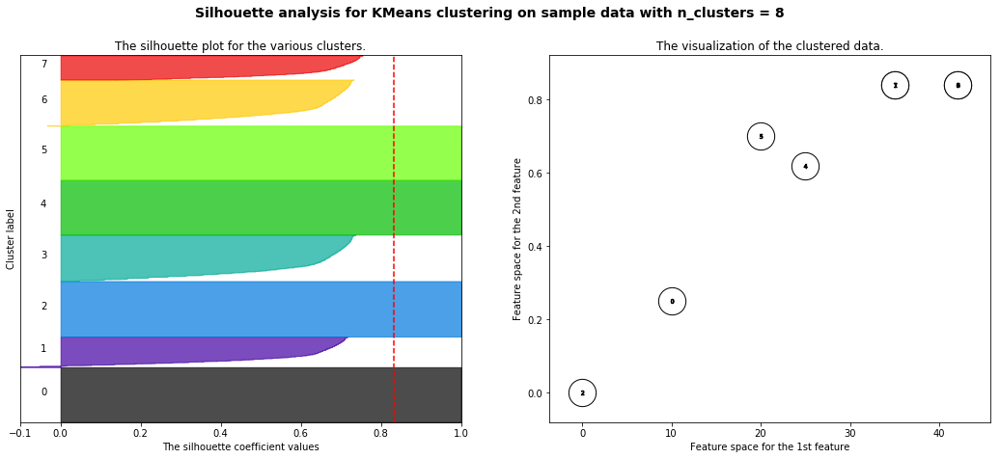

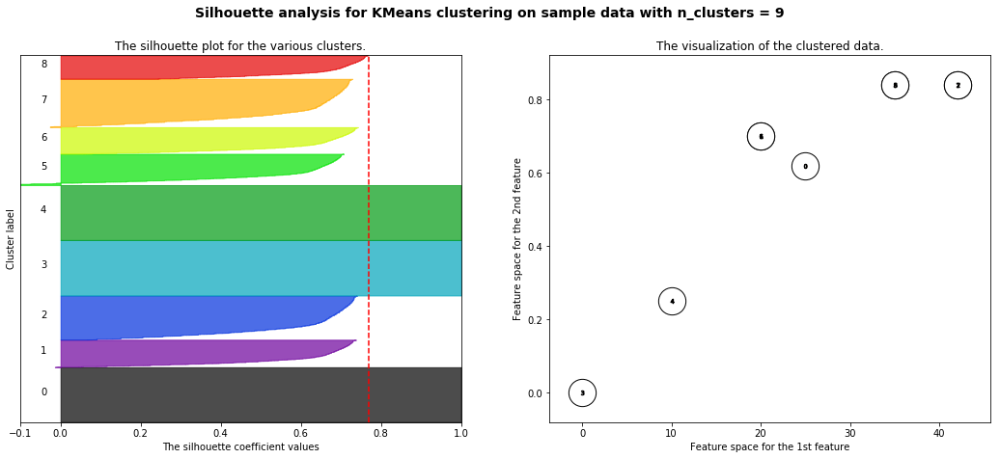

In [76]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_train.iloc[:,3:4]) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(df_train.iloc[:,2:5])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df_train.iloc[:,2:5], cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_train.iloc[:,2:5], cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(df_train.iloc[:,2:3], df_train.iloc[:,3:4], df_train.iloc[:,4:5], alpha=0.7) #, s=10)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=800, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=20, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()
hide()

Great, we can see that the best score actually followed the 3D view. For 6 clusters the score was almost 1.0 (maximum).

__For n_clusters = 6 The average silhouette_score is : 0.9998558910028272__

So we already have the ideal number of clusters. Let's go for the K-Means algorithm now.

In [7]:
# K-Means Algorithm

kmeans = KMeans(n_clusters=6).fit(df_train.iloc[:,2:5]) # Fit K-Means algorithm to Op_Cond data for 6 clusters calculation
centroids = kmeans.cluster_centers_ # Get the calculated centroids
cluster = pd.DataFrame(kmeans.labels_) # Get the calculated labels array and transform it to a single column data frame
df_train = pd.concat([df_train, cluster], axis=1) # Assign the cluster label column to the training set
df_train = df_train.rename(columns = {0:'cluster'}) # Rename the column name to 'cluster'

Let's see how does our operation condition data distribution is given by separating them by the calculated cluster labels.

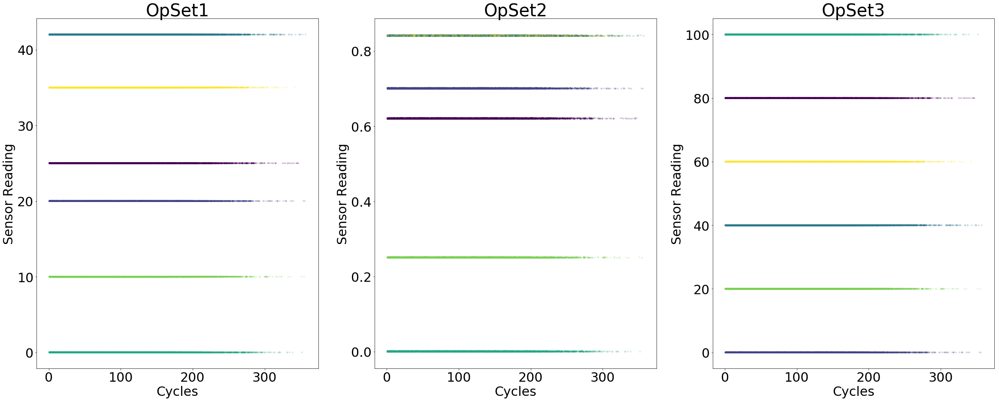

In [88]:
fig,ax=plt.subplots(1,3,figsize=(40,15))#,sharex=True)
c=0
for i in range(0,3):
    ax[i].scatter(df_train['Cycle'], df_train['OpSet'+str(c+1)],s=10,alpha=0.15, c = df_train['cluster'])
    ax[i].set_title('OpSet'+str(c+1), fontsize = 40)
    ax[i].set_xlabel("Cycles", fontsize = 30)
    ax[i].set_ylabel("Sensor Reading", fontsize = 30)
    ax[i].tick_params(axis='both', labelsize=30)
    c+=1
hide()

And let's see how the sensor readings looks like by separating the operation condition cluster by coloers as well. 

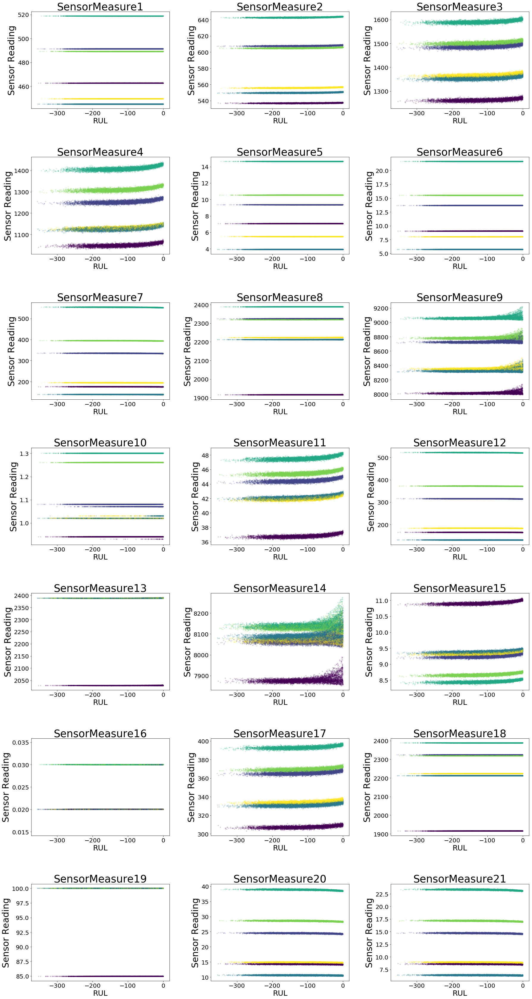

In [89]:
fig,ax=plt.subplots(7,3,figsize=(30,60))
c=0
for i in range(0,7):
    for j in range(0,3):
        plt.subplots_adjust(wspace=0.3, hspace=0.5)
        ax[i,j].scatter(df_train['t_minus'], df_train['SensorMeasure'+str(c+1)],s=10,alpha=0.15, c = df_train['cluster'])
        ax[i,j].set_title('SensorMeasure'+str(c+1), fontsize = 35)
        ax[i,j].set_xlabel("RUL", fontsize = 25)
        ax[i,j].set_ylabel("Sensor Reading", fontsize = 30)
        ax[i,j].tick_params(axis='both', labelsize=20)
        c+=1
hide()

# Step 4. Standardization

Great, we can see that sensors are hugely influenced by operation conditions, even those with weakened patterns.
Now our goal is to remove the highly volatile changes caused by transitioning from condition to condition on data distribution.
For this case we will use a custom standardization technique in which data will be standarized per cluster. It will be performed on 3 simple steps:

1. Separate data according to their cluster label
2. Standarize each sensor individually from each separated data frame using its summary statistics accordinng to the following formula:
                        new_sensor = (old_sensor - old_sensor.mean())/old_sensor.std())
3. Merge the data again __respecting its previous indexes__.

In [8]:
# 1. Separating data according to their cluster label
    
df0 = df_train.iloc[:,5:26][df_train['cluster'] == 0]
df1 = df_train.iloc[:,5:26][df_train['cluster'] == 1]
df2 = df_train.iloc[:,5:26][df_train['cluster'] == 2]
df3 = df_train.iloc[:,5:26][df_train['cluster'] == 3]
df4 = df_train.iloc[:,5:26][df_train['cluster'] == 4]
df5 = df_train.iloc[:,5:26][df_train['cluster'] == 5]
hide()

__IMPORTANT__<br>
Assuming that a perfect linear predictor (sensor) exists for the training set, with a zero value when RUL = 100%, and a value of 100 when RUL = 0, we should use the summary statistics togheter with the calculated centroids coordinates (both for the training set) to standardize the data per operating cluster on the test set, and not calculate them directly on the test set. 

So first of all let's save them below for further calculations.

In [9]:
# Save training features for further calculations

np.save('saved_statistics/centroids_train.npy', centroids)

df0.to_csv('saved_statistics/df0.csv')
df1.to_csv('saved_statistics/df1.csv')
df2.to_csv('saved_statistics/df2.csv')
df3.to_csv('saved_statistics/df3.csv')
df4.to_csv('saved_statistics/df4.csv')
df5.to_csv('saved_statistics/df5.csv')

In [10]:
# 2. Standarize calculations

df0 = (df0 - df0.mean())/df0.std()
df1 = (df1 - df1.mean())/df1.std()
df2 = (df2 - df2.mean())/df2.std()
df3 = (df3 - df3.mean())/df3.std()
df4 = (df4 - df4.mean())/df4.std()
df5 = (df5 - df5.mean())/df5.std()

In [11]:
# 3. Merge data respecting previous indexes and reassign "t_minus" column (RUL)

df_train_standarized = pd.concat([df0, df1, df2, df3, df4, df5])   
df_train_standarized = df_train_standarized.sort_index()
df_train = pd.concat([df_train.iloc[:,:5], df_train_standarized, df_train['t_minus']], axis = 1)

Let's see how does the sensor data looks like after removing the effect of operation condition

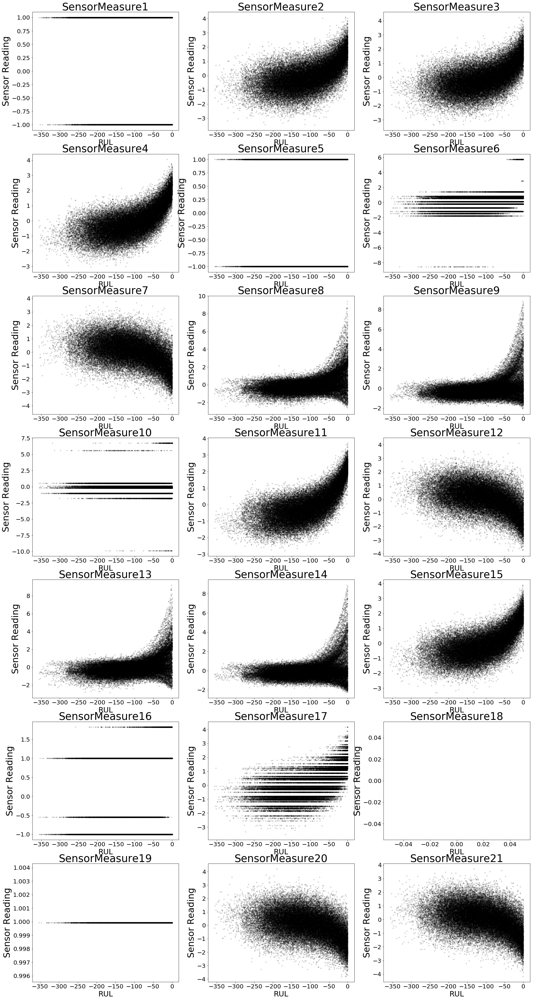

In [12]:
fig,ax=plt.subplots(7,3,figsize=(30,60))
c=0
for i in range(0,7):
    for j in range(0,3):
        #plt.subplots_adjust(wspace=0.3, hspace=0.5)
        ax[i,j].scatter(df_train['t_minus'], df_train['SensorMeasure'+str(c+1)],s=10,alpha=0.15, color = 'black')
        ax[i,j].set_title('SensorMeasure'+str(c+1), fontsize = 35)
        ax[i,j].set_xlabel("RUL", fontsize = 25)
        ax[i,j].set_ylabel("Sensor Reading", fontsize = 30)
        ax[i,j].tick_params(axis='both', labelsize=20)
        c+=1
hide()

# Step 5. Filtering

Looking at the above plots, we can see that some sensors have some extremely similar patterns, such as:<br>
- __Group A:__ 2, 3, 4, 11, 15, 17<br>
- __Group B:__ 7, 12, 20, 21<br>
- __Group C:__ 8, 9, 13, 14<br>


Note that the blank graphs correspond to sensors which present zero variation within operating clusters. When the cluster mean value is subtracted from these sensors, the resulting recorded value is constantly zero, i.e. no predictive power for our purposes. Furthermore, there are a few sensors which present zero variability within some operating clusters, for which the resulting values from the above code snippet are NaNs, due to the fact we divide by a zero-valued standard deviation.
Alright, let's drop the sensors that does not describe any pattern, they are:<br>
- Blank or No pattern sensors: 1, 5, 6, 10, 16, 18, 19

In [13]:
# Drop useless sensors

df_train = df_train.drop('SensorMeasure1', 1)
df_train = df_train.drop('SensorMeasure5', 1)
df_train = df_train.drop('SensorMeasure6', 1)
df_train = df_train.drop('SensorMeasure10', 1)
df_train = df_train.drop('SensorMeasure16', 1)
df_train = df_train.drop('SensorMeasure18', 1)
df_train = df_train.drop('SensorMeasure19', 1)

In [14]:
sensor_a = pd.concat([df_train['SensorMeasure2'], df_train['SensorMeasure3'], df_train['SensorMeasure4'], df_train['SensorMeasure11'], df_train['SensorMeasure15'], df_train['SensorMeasure17']], axis=1)
sensor_b = pd.concat([df_train['SensorMeasure7'], df_train['SensorMeasure12'], df_train['SensorMeasure20'], df_train['SensorMeasure21']], axis=1)
sensor_c = pd.concat([df_train['SensorMeasure8'], df_train['SensorMeasure9'], df_train['SensorMeasure13'], df_train['SensorMeasure14']], axis=1)

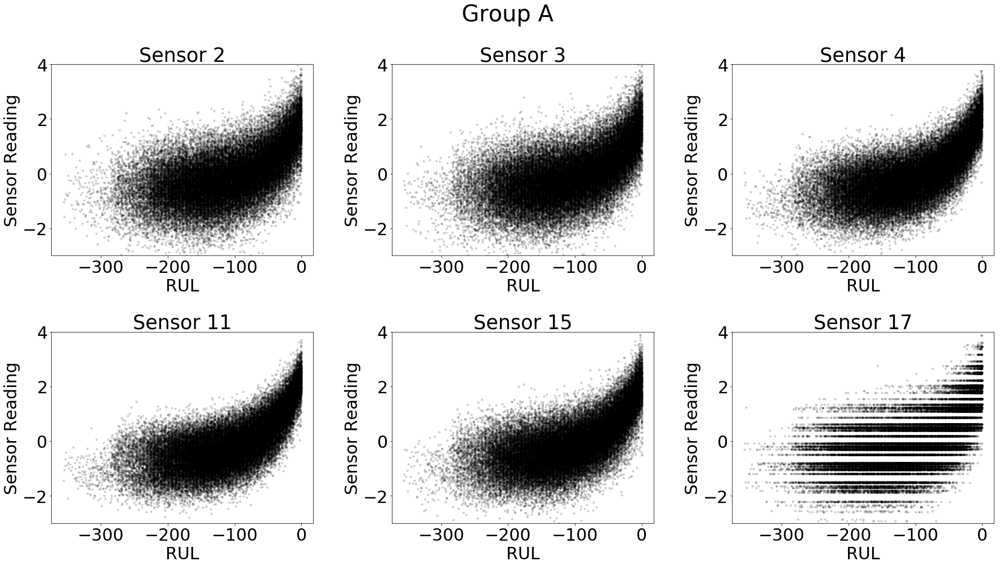

In [124]:
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(30,15))
fig.subplots_adjust(wspace=0.3, hspace=0.4)
fig.suptitle('Group A', fontsize = 40)
list_a = [2, 3, 4, 11, 15, 17]
c=0
for row in ax:
    for col in row:
        col.scatter(df_train['t_minus'], sensor_a.iloc[:, c+1:c+2], s=10,alpha=0.15, color = 'black')
        col.set_title('Sensor '+str(list_a[c]), fontsize = 35)
        col.tick_params(axis='both', labelsize=30)
        col.set_xlabel("RUL", fontsize = 30)
        col.set_ylabel("Sensor Reading", fontsize = 30)
        col.set_ylim(-3, 4)
        c = c+1
plt.show()
hide()

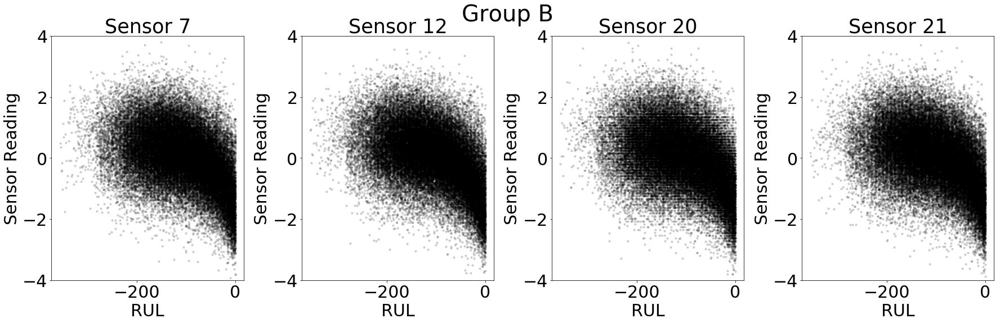

In [125]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,8))
fig.suptitle('Group B', fontsize = 40)
fig.subplots_adjust(wspace=0.3)
ax1.set_ylim(-4, 4)
ax2.set_ylim(-4, 4)
ax3.set_ylim(-4, 4)
ax4.set_ylim(-4, 4)

ax1.scatter(df_train['t_minus'], sensor_b.iloc[:, 1:2], s=10,alpha=0.15, color = 'black')
ax1.set_title('Sensor 7', fontsize = 35)
ax1.tick_params(axis='both', labelsize=30)
ax1.set_xlabel("RUL", fontsize = 30)
ax1.set_ylabel("Sensor Reading", fontsize = 30)

ax2.scatter(df_train['t_minus'], sensor_b.iloc[:, 2:3], s=10,alpha=0.15, color = 'black')
ax2.set_title('Sensor 12', fontsize = 35)
ax2.tick_params(axis='both', labelsize=30)
ax2.set_xlabel("RUL", fontsize = 30)
ax2.set_ylabel("Sensor Reading", fontsize = 30)

ax3.scatter(df_train['t_minus'], sensor_b.iloc[:, 3:4], s=10,alpha=0.15, color = 'black')
ax3.set_title('Sensor 20', fontsize = 35)
ax3.tick_params(axis='both', labelsize=30)
ax3.set_xlabel("RUL", fontsize = 30)
ax3.set_ylabel("Sensor Reading", fontsize = 30)

ax4.scatter(df_train['t_minus'], sensor_b.iloc[:, 4:5], s=10,alpha=0.15, color = 'black')
ax4.set_title('Sensor 21', fontsize = 35)
ax4.tick_params(axis='both', labelsize=30)
ax4.set_xlabel("RUL", fontsize = 30)
ax4.set_ylabel("Sensor Reading", fontsize = 30)
hide()

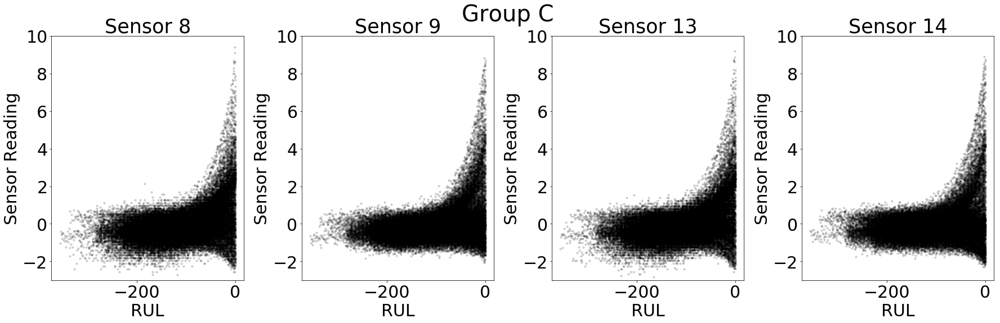

In [126]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,8))
fig.suptitle('Group C', fontsize = 40)
fig.subplots_adjust(wspace=0.3)

ax1.set_ylim(-3, 10)
ax2.set_ylim(-3, 10)
ax3.set_ylim(-3, 10)
ax4.set_ylim(-3, 10)

ax1.scatter(df_train['t_minus'], sensor_c.iloc[:, 1:2], s=10,alpha=0.15, color = 'black')
ax1.set_title('Sensor 8', fontsize = 35)
ax1.tick_params(axis='both', labelsize=30)
ax1.set_xlabel("RUL", fontsize = 30)
ax1.set_ylabel("Sensor Reading", fontsize = 30)

ax2.scatter(df_train['t_minus'], sensor_c.iloc[:, 2:3], s=10,alpha=0.15, color = 'black')
ax2.set_title('Sensor 9', fontsize = 35)
ax2.tick_params(axis='both', labelsize=30)
ax2.set_xlabel("RUL", fontsize = 30)
ax2.set_ylabel("Sensor Reading", fontsize = 30)

ax3.scatter(df_train['t_minus'], sensor_c.iloc[:, 3:4], s=10,alpha=0.15, color = 'black')
ax3.set_title('Sensor 13', fontsize = 35)
ax3.tick_params(axis='both', labelsize=30)
ax3.set_xlabel("RUL", fontsize = 30)
ax3.set_ylabel("Sensor Reading", fontsize = 30)

ax4.scatter(df_train['t_minus'], sensor_c.iloc[:, 4:5], s=10,alpha=0.15, color = 'black')
ax4.set_title('Sensor 14', fontsize = 35)
ax4.tick_params(axis='both', labelsize=30)
ax4.set_xlabel("RUL", fontsize = 30)
ax4.set_ylabel("Sensor Reading", fontsize = 30)
hide()

Let's check the variability of the sensors by looking after their violin plot.

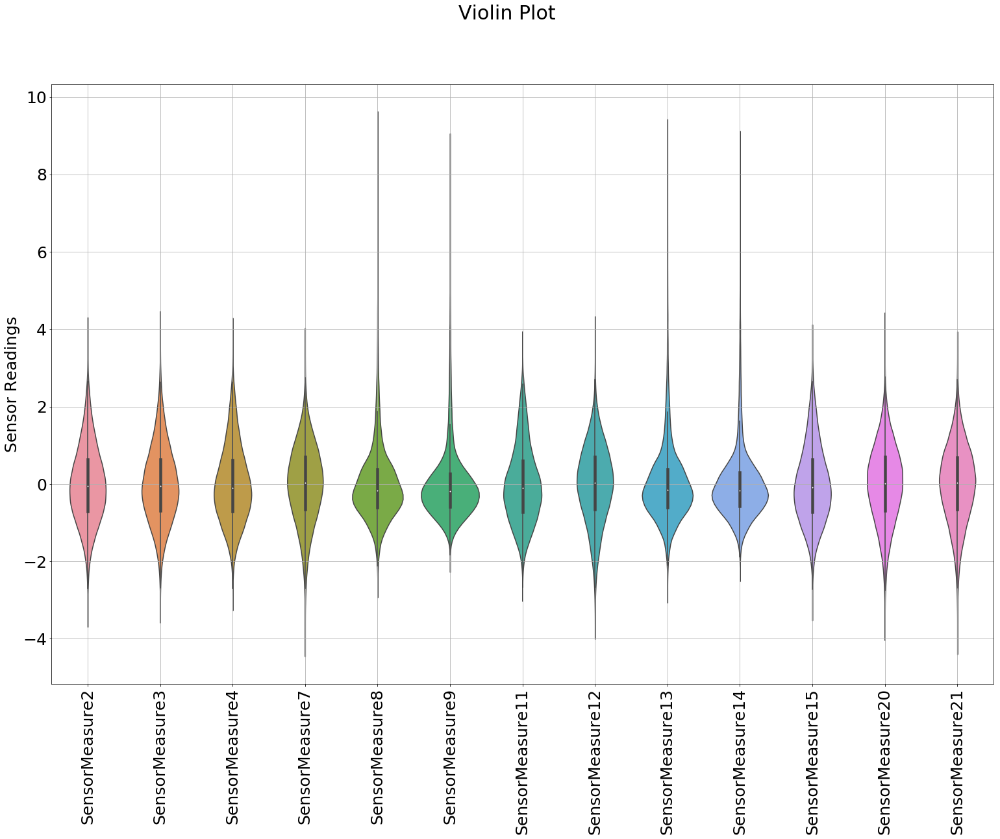

In [28]:
fig, ax = pyplot.subplots(figsize =(26, 17)) 
sns.violinplot(ax = ax,  data = df_train.iloc[:,5:18])
plt.suptitle('Violin Plot', fontsize = 30)
plt.ylabel('Sensor Readings', fontsize = 25)
plt.xticks(rotation = 90)
plt.tick_params(axis='both', labelsize=25)
plt.grid()
hide()

Looking after this violin plot we can see that the variability of all remaining sensors is reasonably stable, except by Sensor 17. The sensors 8, 9, 13 and 14 have some outliers. We will remove the sensor 17 and pass all sensors through an outlier remover code. The outliers will be removed based on their statistical values and the mathematical base will be Z-score.

In [37]:
# Drop sensor 17

df_train = df_train.drop('SensorMeasure17', 1)
sensor_a = sensor_a.drop('SensorMeasure17', 1)

In [38]:
from scipy import stats

limit = 4

z_a = np.abs(stats.zscore(sensor_a))
new_a = sensor_a[(z_a < limit).all(axis=1)]
find_a = pd.DataFrame(np.where(z_a >= limit))
find_a = find_a.T
unique_removed_rows_a = find_a[0].unique()

z_b = np.abs(stats.zscore(sensor_b))
new_b = sensor_b[(z_b < limit).all(axis=1)]
find_b = pd.DataFrame(np.where(z_b >= limit))
find_b = find_b.T
unique_removed_rows_b = find_b[0].unique()

z_c = np.abs(stats.zscore(sensor_c))
new_c = sensor_c[(z_c < limit).all(axis=1)]
find_c = pd.DataFrame(np.where(z_c >= limit))
find_c = find_c.T
unique_removed_rows_c = find_c[0].unique()

In [39]:
print('Sensor A, outliers detected: ', unique_removed_rows_a.shape[0])
print('Sensor B, outliers detected: ', unique_removed_rows_b.shape[0])
print('Sensor C, outliers detected: ', unique_removed_rows_c.shape[0])

Sensor A, outliers detected:  10
Sensor B, outliers detected:  4
Sensor C, outliers detected:  551


We have detected the rows which outliers are in sensors A, B and C. However, there is still the possibility that the same row has been detected for more than one sensor.
Let's do some code and get an array of the indexes where at least one outlier was detected, and create a new dataframe without them.

In [40]:
# Convert arrays to data frames
unique_removed_rows_a = pd.DataFrame(unique_removed_rows_a)
unique_removed_rows_b = pd.DataFrame(unique_removed_rows_b)
unique_removed_rows_c = pd.DataFrame(unique_removed_rows_c)

# Concatenate them
unique_removed_rows = pd.concat([unique_removed_rows_a, unique_removed_rows_b, unique_removed_rows_c])

# Drop repeated values
unique_removed_rows = unique_removed_rows[0].unique()

# Create a new DataFrame from the training set sensors without the outliers rows
new_df = df_train.iloc[:,5:18]
new_df = new_df.drop(unique_removed_rows)

In [41]:
print('Total of removed samples: ', unique_removed_rows.shape[0])
print('Previous number of samples: ', df_train.shape[0])
print('New number of samples: ', new_df.shape[0])
print('Just for checking: ', len(df_train), '-', len(new_df), ' = ', len(df_train)-len(new_df))
print('Percentage removed: ', (unique_removed_rows.shape[0]/df_train.shape[0])*100, '%')

Total of removed samples:  559
Previous number of samples:  45918
New number of samples:  45359
Just for checking:  45918 - 45359  =  559
Percentage removed:  1.217387516877913 %


Note that we removed 559 rows from our original data set, we need to be careful since means that some operational cycles has been removed from some tests.
So we will need to reconstruct the  training set, but for that, consider:

- The test's labels (RUL) will keep the same since all of them still reach the failure condition.
- Some tests will now have shorter time intervals.

Alright let's reconstruct our data.

In [42]:
# RECONSTRUCTING DATA AFTER OUTLIER REMOVER


# Working on removed samples per unit test ######################################################################

removed_tests = df_train.ix[unique_removed_rows] # get rows to be removed from original training set
count = [] # this list will further receive the number of removed samples from each test 
cob = 0
for i in range(1, df_train['UnitNumber'].max()+1):
    for j in removed_tests.index:
        if (removed_tests['UnitNumber'][j] == i):
            cob = cob + 1
    count.append(cob)
    cob = 0
count = np.array(count)
new_rul_unitno = rul_unitno - count # this new variable holds the new total operation time from each test
################################################################################################################

## Create new T_minus ##########################################################################################

idx = []
for i in range(0,218):
    big = int(new_rul_unitno[i])
    for j in range(-big+1, 1):
        idx.append(j)
idx = pd.DataFrame(idx)
idx.columns = (['t_minus'])
################################################################################################################

## Create new unit_no column ###################################################################################

unitt = []
for i in range(1,219):
    big2 = new_rul_unitno[i-1]
    for j in range(0, big2):
        unitt.append(i)
unitt = pd.DataFrame(unitt)
unitt.columns = (['unit'])
################################################################################################################


## Merge and rename columns

new_df = new_df.reset_index(drop=True)
new_df = pd.concat([unitt, idx, new_df], axis=1)
columnsTitles=["unit", "t_minus", "SensorMeasure2", "SensorMeasure3", "SensorMeasure4", "SensorMeasure11", "SensorMeasure15", "SensorMeasure7", "SensorMeasure12", "SensorMeasure20", "SensorMeasure21", "SensorMeasure8", "SensorMeasure9", "SensorMeasure13", "SensorMeasure14"]
new_df = new_df.reindex(columns=columnsTitles)

C:\Users\Usuario\Anaconda2\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
  


Let's see how our data looks like now

In [43]:
new_df.head(10)

,unit,t_minus,SensorMeasure2,SensorMeasure3,SensorMeasure4,SensorMeasure11,SensorMeasure15,SensorMeasure7,SensorMeasure12,SensorMeasure20,SensorMeasure21,SensorMeasure8,SensorMeasure9,SensorMeasure13,SensorMeasure14
0,1,-222,-1.665632,-0.460749,-0.168926,-0.381652,-1.170261,0.854709,1.356057,0.377638,0.675882,-0.979729,-0.778572,-0.360213,-0.822667
1,1,-221,-1.201429,-1.040821,-0.626306,-1.033286,-1.468330,0.423932,0.637697,1.036511,0.735170,-1.379841,-0.837832,0.652737,-0.472019
2,1,-220,-0.920577,0.218738,-1.283192,-0.335412,0.550747,1.060663,0.668876,0.022284,-0.595856,-0.561667,-0.646282,-0.544988,-0.461147
3,1,-219,-1.212605,0.422369,-0.577304,-0.877818,-0.314185,0.608356,-0.016306,-0.202145,1.411592,-1.335711,-0.431113,-0.651533,-0.817049
4,1,-218,-0.456453,-0.034709,-0.513961,-1.595426,-2.132310,-0.856394,-0.271838,3.771104,0.808162,-0.500056,-0.689555,-0.429268,-0.286493
5,1,-217,-0.486520,-0.966456,0.668783,-0.283821,-0.195917,0.091537,1.047487,-0.052074,0.395726,-0.636227,-0.998315,-0.803946,-0.761349
6,1,-216,-0.342574,-0.043535,0.428604,-0.315426,-0.052386,1.108920,-1.088904,-0.497447,1.167346,-0.433786,-0.561243,-0.459980,-0.386247
7,1,-215,-1.304856,-0.192467,-0.210731,-0.215623,-0.279655,0.201810,0.539062,0.978897,-0.492184,-0.059956,-0.604361,-1.091965,-0.447119
8,1,-214,-0.022372,-0.764258,-1.193000,-0.994350,-1.427056,0.692816,0.510881,1.036511,-0.420381,-0.059956,-0.553496,-0.365006,-0.480912
9,1,-213,0.249594,-0.262440,-0.412026,-1.083426,-0.285597,-0.562727,-0.622009,1.544034,1.189305,-0.367516,-0.386475,-0.367845,-0.150083


Ok, let's put the sensors side by side grouped by their respective groups and generate a new violin plot with the same vertical bounds we plotted the last one and let's compare the result

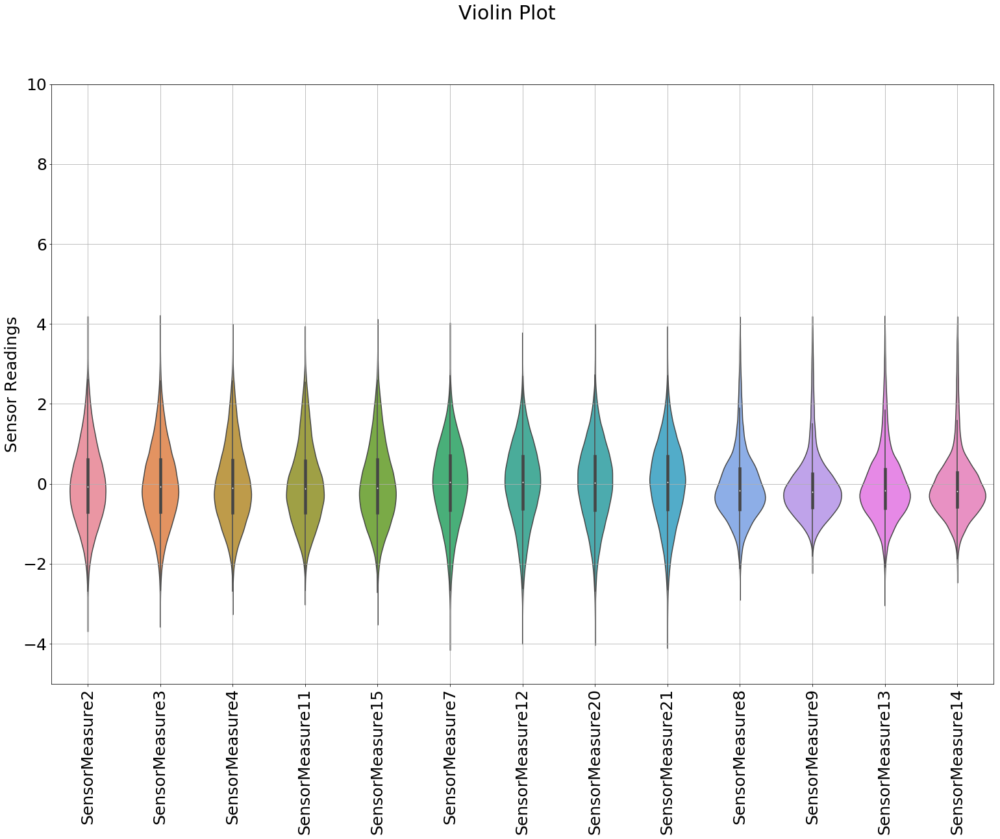

In [44]:
fig, ax = pyplot.subplots(figsize =(26, 17)) 
sns.violinplot(ax = ax,  data = new_df.iloc[:, 2:])
plt.suptitle('Violin Plot', fontsize = 30)
plt.ylabel('Sensor Readings', fontsize = 25)
plt.xticks(rotation = 90)
plt.tick_params(axis='both', labelsize=25)
plt.ylim(-5, 10)
#plt.yticks(labelsize = 25)
plt.grid()
hide()

Very good, looks like our sensors selection step is done.
Let's take a look at the correlation matrix of the sensors separated by their groups

In [45]:
corr_a = new_df.iloc[:, 2:7].corr()
print('                                         SENSOR A')
print('Correlation average\n', corr_a.mean().mean())
corr_a.style.background_gradient(cmap='coolwarm').set_precision(2)

                                         SENSOR A
Correlation average
 0.7091409538233154


,SensorMeasure2,SensorMeasure3,SensorMeasure4,SensorMeasure11,SensorMeasure15
SensorMeasure2,1,0.5,0.61,0.64,0.59
SensorMeasure3,0.5,1,0.59,0.63,0.58
SensorMeasure4,0.61,0.59,1,0.77,0.71
SensorMeasure11,0.64,0.63,0.77,1,0.76
SensorMeasure15,0.59,0.58,0.71,0.76,1


In [46]:
corr_b = new_df.iloc[:, 7:11].corr()
print('                                         SENSOR B')
print('Correlation average\n', corr_b.mean().mean())
corr_b.style.background_gradient(cmap='coolwarm').set_precision(2)

                                         SENSOR B
Correlation average
 0.5333381066915528


,SensorMeasure7,SensorMeasure12,SensorMeasure20,SensorMeasure21
SensorMeasure7,1,0.43,0.37,0.37
SensorMeasure12,0.43,1,0.38,0.39
SensorMeasure20,0.37,0.38,1,0.33
SensorMeasure21,0.37,0.39,0.33,1


In [47]:
corr_c = new_df.iloc[:, 11:].corr()
print('                                         SENSOR C')
print('Correlation average\n', corr_c.mean().mean())
corr_c.style.background_gradient(cmap='coolwarm').set_precision(2)

                                         SENSOR C
Correlation average
 0.7687600820860768


,SensorMeasure8,SensorMeasure9,SensorMeasure13,SensorMeasure14
SensorMeasure8,1,0.6,0.93,0.55
SensorMeasure9,0.6,1,0.6,0.92
SensorMeasure13,0.93,0.6,1,0.55
SensorMeasure14,0.55,0.92,0.55,1


Interesting. We reduced our data until a point that all of them bring us relevant information. And through the correlation scores, we can see that the sensor groups are extremely similar to each other, especially groups A and C, whose correlation exceeds 70%. Let's take advantage of this situation in addition to the fact that we have limited hardware processing and perform dimensionality reduction technique.

# Step 6. Dimensionality Reduction

We will perform an unsupervised learning technique called PCA (principal component analysis). Basically this algorithm gets a certain amount of inputs and reduce its dimensionality to a N amount outputs based on the most relevant and original information from each input.<br>
Our strategy will be to apply this algorithm for each sensor group and reduce their dimensionality to 1. In other words, after this step we will have three different sensors.

In [55]:
new_df.head()

,unit,t_minus,SensorMeasure2,SensorMeasure3,SensorMeasure4,SensorMeasure11,SensorMeasure15,SensorMeasure7,SensorMeasure12,SensorMeasure20,SensorMeasure21,SensorMeasure8,SensorMeasure9,SensorMeasure13,SensorMeasure14
0,1,-222,-1.665632,-0.460749,-0.168926,-0.381652,-1.170261,0.854709,1.356057,0.377638,0.675882,-0.979729,-0.778572,-0.360213,-0.822667
1,1,-221,-1.201429,-1.040821,-0.626306,-1.033286,-1.468330,0.423932,0.637697,1.036511,0.735170,-1.379841,-0.837832,0.652737,-0.472019
2,1,-220,-0.920577,0.218738,-1.283192,-0.335412,0.550747,1.060663,0.668876,0.022284,-0.595856,-0.561667,-0.646282,-0.544988,-0.461147
3,1,-219,-1.212605,0.422369,-0.577304,-0.877818,-0.314185,0.608356,-0.016306,-0.202145,1.411592,-1.335711,-0.431113,-0.651533,-0.817049
4,1,-218,-0.456453,-0.034709,-0.513961,-1.595426,-2.132310,-0.856394,-0.271838,3.771104,0.808162,-0.500056,-0.689555,-0.429268,-0.286493


In [57]:
new_df.shape[0]

45359

In [58]:
pca_a = PCA(n_components=1, whiten=True, random_state=0, copy=False)
PCA_a = pca_a.fit_transform(new_df.iloc[:, 2:7])
PCA_a = pd.DataFrame(PCA_a)
PCA_a = pd.concat([PCA_a, new_df['unit']], axis=1)
PCA_a.columns = (['value', 'unit'])
PCA_a = PCA_a.set_index(new_df['t_minus'])
pca_matrix_a = pca_a.components_
sing = pca_a.singular_values_
pca_matrix_a = pca_matrix_a*(np.sqrt(new_df.shape[0])/sing)
pca_matrix_a = pca_matrix_a.T

pca_b = PCA(n_components=1, whiten=True, random_state=0, copy=False)
PCA_b = pca_b.fit_transform(new_df.iloc[:, 7:11])
PCA_b = pd.DataFrame(PCA_b)
PCA_b = pd.concat([PCA_b, new_df['unit']], axis=1)
PCA_b.columns = (['value', 'unit'])
PCA_b = PCA_b.set_index(new_df['t_minus'])
pca_matrix_b = pca_b.components_
sing = pca_b.singular_values_
pca_matrix_b = pca_matrix_b*(np.sqrt(new_df.shape[0])/sing)
pca_matrix_b = pca_matrix_b.T

pca_c = PCA(n_components=1, whiten=True, random_state=0, copy=False)
PCA_c = pca_c.fit_transform(new_df.iloc[:, 11:])
PCA_c = pd.DataFrame(PCA_c)
PCA_c = pd.concat([PCA_c, new_df['unit']], axis=1)
PCA_c.columns = (['value', 'unit'])
PCA_c = PCA_c.set_index(new_df['t_minus'])
pca_matrix_c = pca_c.components_
sing = pca_c.singular_values_
pca_matrix_c = pca_matrix_c*(np.sqrt(new_df.shape[0])/sing)
pca_matrix_c = pca_matrix_c.T

To reduce dimensionality, PCA performs calculations based on a transformation matrix. Let's save this matrix also for later use in the test set.

In [60]:
np.save('saved_statistics/pca_matrix_a.npy', pca_matrix_a)
np.save('saved_statistics/pca_matrix_b.npy', pca_matrix_b)
np.save('saved_statistics/pca_matrix_c.npy', pca_matrix_c)

Alright, let's see how does our new sensors looks like now:

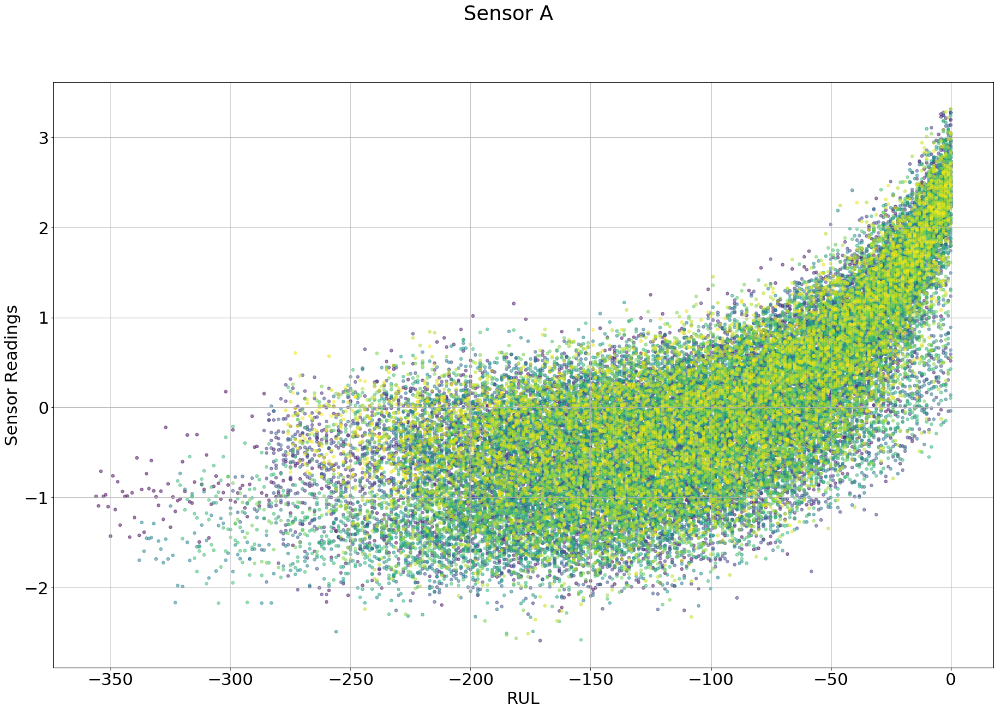

In [61]:
## Let's see how does our new sensor data looks like now

fig = plt.figure(figsize=(25,16))
plt.scatter(x=PCA_a.index, y=PCA_a['value'], s=20, alpha=0.5, c=PCA_a['unit'])
plt.suptitle('Sensor A', fontsize = 30)
plt.xlabel('RUL', fontsize = 25)
plt.ylabel('Sensor Readings', fontsize = 25)
plt.tick_params(axis='both', labelsize=25)
plt.grid()
plt.show()
hide()

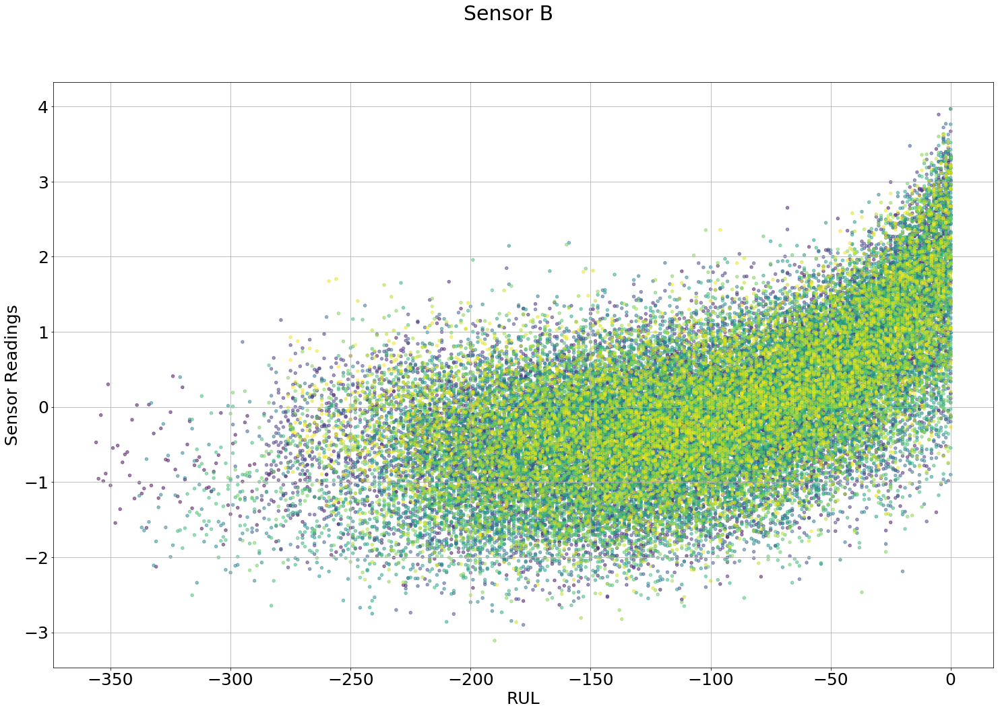

In [62]:
## Let's see how does our new sensor data looks like now

fig = plt.figure(figsize=(25,16))
plt.scatter(x=PCA_b.index, y=PCA_b['value'], s=20, alpha=0.5, c=PCA_b['unit'])
plt.suptitle('Sensor B', fontsize = 30)
plt.xlabel('RUL', fontsize = 25)
plt.ylabel('Sensor Readings', fontsize = 25)
plt.tick_params(axis='both', labelsize=25)
plt.grid()
plt.show()
hide()

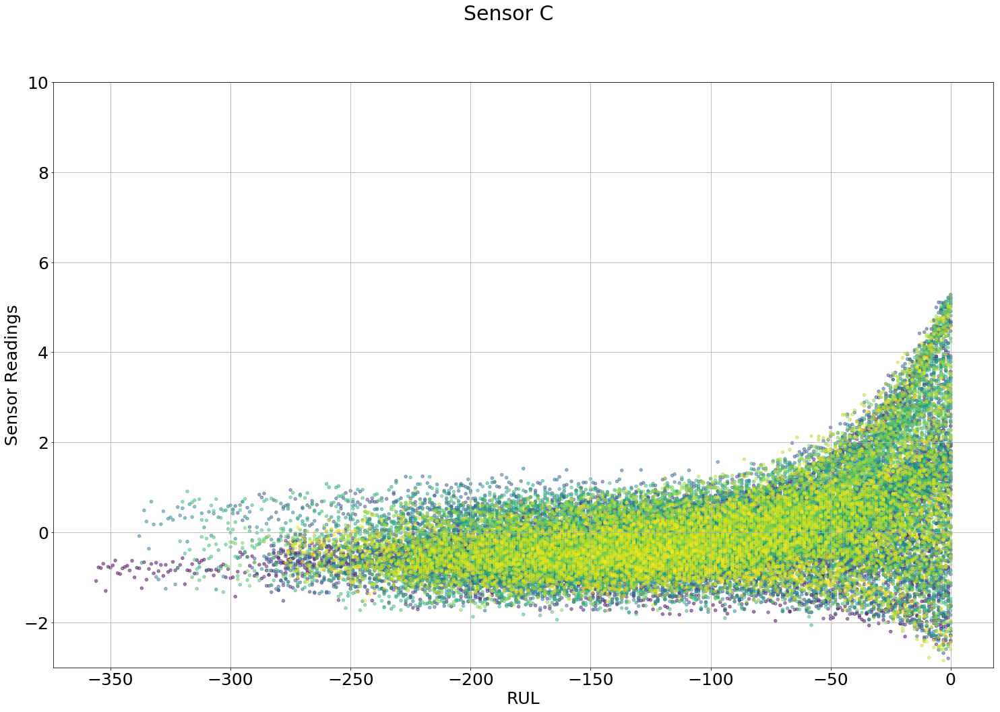

In [65]:
## Let's see how does our new sensor data looks like now

fig = plt.figure(figsize=(25,16))
plt.scatter(x=PCA_c.index, y=PCA_c['value'], s=20, alpha=0.5, c=PCA_c['unit'])
plt.suptitle('Sensor C', fontsize = 30)
plt.xlabel('RUL', fontsize = 25)
plt.ylabel('Sensor Readings', fontsize = 25)
plt.tick_params(axis='both', labelsize=25)
plt.ylim(-3,10)
plt.grid()
plt.show()
hide()

We will also need to extract some statistics from the data at this point, so let's save them as well.

In [64]:
PCA_a['value'].to_csv('saved_statistics/ICA_a.csv')
PCA_b['value'].to_csv('saved_statistics/ICA_b.csv')
PCA_c['value'].to_csv('saved_statistics/ICA_c.csv')
hide()

C:\Users\Usuario\Anaconda2\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.
C:\Users\Usuario\Anaconda2\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  
C:\Users\Usuario\Anaconda2\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  This is separate from the ipykernel package so we can avoid doing imports unti

# Step 7. Log Transform

Good, our new three sensors seems to have a strong pattern and a reasonable correlation which the target variable: time.
But our data is still quite skewed, and it definetely will not be easy to further extract features from it.

To deal with this issue let's perform a log transform of our sensors.

The log transformation can be used to make highly skewed distributions less skewed. This can be valuable both for making patterns in the data more interpretable and for helping to meet the assumptions of inferential statistics, but we should use it carefully.
In addition, there are two circumstances in which the log transform can optimize our data distribution:

1. When we are facing a relative change issue.
Log-scale informs on relative changes (multiplicative), while linear-scale informs on absolute changes (additive).
Which in our case makes sense, since we will train algorithms that will evaluate the non linear relations between the input curves and their respective labels.

3. In general whether or not you have causal series, the only time you would be justified or correct in taking the Log of a data distribution is when it can be proven that the variance of the data (Y) is proportional to the expected value of (Y^2).
And it's also our case, mainly in the case of sensors A and B, in which this behavior is more clear.

Note that we also added the absolute value of the minimum value of each sensor to improve the linear behavior of our data distribution.

In [66]:
## Log_transform

min_a = abs(PCA_a['value'].min())
jow_a = PCA_a['value'] + min_a
jow_a = pd.DataFrame(jow_a)
df_log_a = jow_a.applymap(lambda x: np.log(x+1))

min_b = abs(PCA_b['value'].min())
jow_b = PCA_b['value'] + min_b
jow_b = pd.DataFrame(jow_b)
df_log_b = jow_b.applymap(lambda x: np.log(x+1))

min_c = abs(PCA_c['value'].min())
jow_c = PCA_c['value'] + min_c
jow_c = pd.DataFrame(jow_c)
df_log_c = jow_c.applymap(lambda x: np.log(x+1))

df_log = pd.concat([PCA_a['unit'], df_log_a, df_log_b, df_log_c], axis=1)
df_log.columns = (['unit', 'sensor_a', 'sensor_b', 'sensor_c'])

hide()

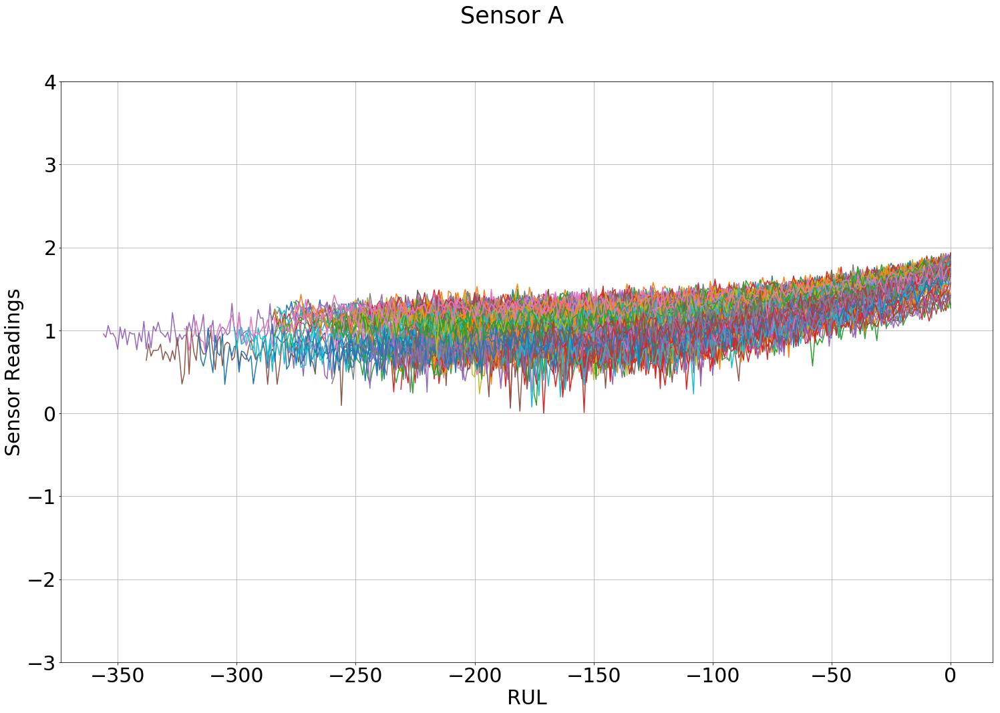

In [69]:
## Sensor A
fig = plt.figure(figsize=(25,16))
plt.suptitle('Sensor A', fontsize = 35)
plt.xlabel('RUL', fontsize = 30)
plt.ylabel('Sensor Readings', fontsize = 30)
plt.tick_params(axis='both', labelsize=30)
plt.ylim(-3, 4)
for i in range(1,df_log['unit'].max()+1):
    plt.plot(df_log.index[df_log['unit'] == i], df_log['sensor_a'][df_log['unit'] == i])
plt.grid()
plt.show()
hide()

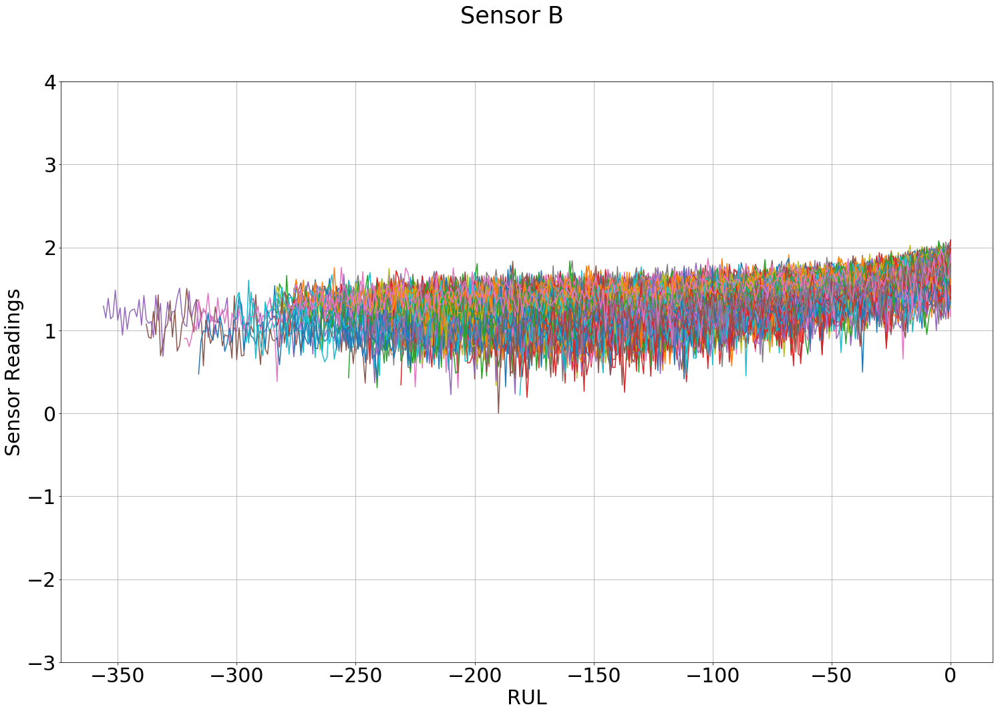

In [73]:
## Sensor A
fig = plt.figure(figsize=(25,16))
plt.suptitle('Sensor B', fontsize = 35)
plt.xlabel('RUL', fontsize = 30)
plt.ylabel('Sensor Readings', fontsize = 30)
plt.tick_params(axis='both', labelsize=30)
plt.ylim(-3, 4)
for i in range(1,df_log['unit'].max()+1):
    plt.plot(df_log.index[df_log['unit'] == i], df_log['sensor_b'][df_log['unit'] == i])
plt.grid()
plt.show()
hide()

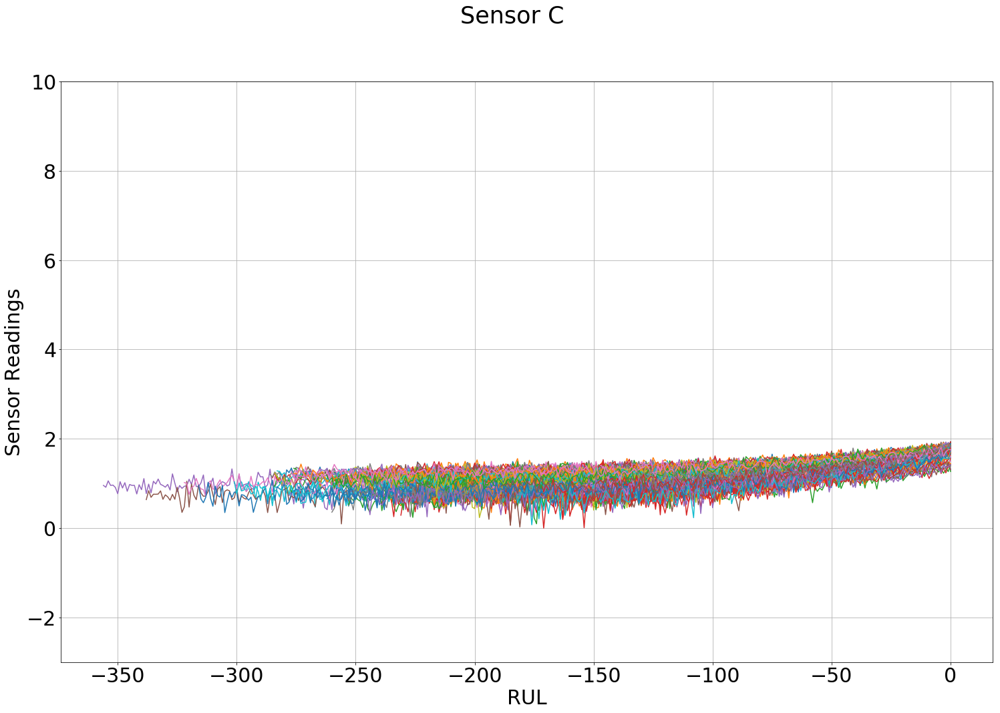

In [72]:
## Sensor A
fig = plt.figure(figsize=(25,16))
plt.suptitle('Sensor C', fontsize = 35)
plt.xlabel('RUL', fontsize = 30)
plt.ylabel('Sensor Readings', fontsize = 30)
plt.tick_params(axis='both', labelsize=30)
plt.ylim(-3, 10)
for i in range(1,df_log['unit'].max()+1):
    plt.plot(df_log.index[df_log['unit'] == i], df_log['sensor_a'][df_log['unit'] == i])
plt.grid()
plt.show()
hide()

Nice, by plotting with the same Y range we can see that our sensor data is pretty less skewed than before.

Now we are ready for the last step: feature extraction.
However this last step will be done in part two because we also want to extract the features from our artificial training sets (truncated).

Let's just remember the statistics we extracted from the original training set before we dive in the part two:
1. Operational settings cluster centroids
2. Sensor raw data separated by the calculated clusters to standarize the sensors per cluster with the purpose of removing the operation settings effect.
3. The transformation matrix (PCA object) which will be necessary to calculate the PCA of the next data according to the same parameters.
4. The " after PCA step" sensors values in which will be necessary to calculate the next log transformations. 

# ----------------------------------------------------------------------------------------------------------------

## PART2 - ARTIFICIAL TRAINING SETS

Since the test set contains truncated data, which is components whose sensor trajectories do not reach the end of their lifetime, we will truncate the training set at random moments through a unit’s lifetime, well be able to make a dataset more similar to the one that our models will be evaluated on.
Tests will be cut at random moments within pre-established periods based on the percentage of each test's operating time. The pre-established ranges are:
1. 80% -100%
2. 60% -80%
3. 40% -60%
4. 20% -40%

The goal is to cover the entire time intervals of the test set's tests operating times. And in this case it is equivalent to approximately 20% of the smallest train set test.<br>
We can have a better idea about the cuts be looking the figure below
<br><br>
<img style="display:inline; margin-left:100px" width=75% src="figures/train_exemple_truncated2.png"/>
<br><br>
So we will create 4 artificial tests for each original test. We will have 1090 test in total.<br>
__It's very importante to point that the time taken from each test will be the label of this same test.__

In [225]:
# Load train DATA

df_train=pd.read_csv('original_data/train.txt',delim_whitespace=True, names=input_file_column_names)
rul_unitno=[max(df_train.query('UnitNumber=='+str(i)).Cycle) for i in range(1,219)]
t_minus_temp=[df_train.query('UnitNumber=='+str(i)).Cycle.values-rul_unitno[i-1] for i in range(1,219)]
t_minus_list=[j for i in t_minus_temp for j in i]
df_train=df_train.assign(t_minus=t_minus_list)
print('shape: ', df_train.shape)

shape:  (45918, 27)


In [226]:
## GENERATES 4 NEW TESTS FOR EACH ORIGINAL TEST WITH PRE-DEFINED OPERATION TIME PERCENTAGE

start = time.time()
new_sets = pd.DataFrame()
new_ruls = []
new_cycles = []
count = 218
for i in range(1, df_train['UnitNumber'].max()+1):
    for j in range(1,5):
        df = df_train[df_train['UnitNumber'] == i]
        df = pd.DataFrame(df)
        df = df.reset_index(drop=True)
        low = j - (j-1) - 0.2*j
        high = low + 0.2
        max_cycles = rul_unitno[i-1]
        low_limit = int(max_cycles*low)
        high_limit = int(max_cycles*high)
        ref = random.sample(range(low_limit, high_limit), 1)
        ref = ref[0]
        new_cycles.append(ref)
        new_rul = max_cycles - ref
        new_ruls.append(new_rul) ##labels
        df = df[:ref] ## new set
        count = count + 1
        df['UnitNumber'] = count
        new_sets = new_sets.append(df, ignore_index=True)
df_train = pd.concat([df_train, new_sets])
df_train = df_train.reset_index(drop=True)
orig_rul = np.zeros(218)
orig_rul = pd.DataFrame(orig_rul)
new_ruls = pd.DataFrame(new_ruls)
labels = pd.concat([orig_rul, new_ruls])
labels = np.array(labels).reshape((-1))

rul_unitno = pd.DataFrame(rul_unitno)
new_cycles = pd.DataFrame(new_cycles)
artificial_rul_unitno = pd.concat([rul_unitno[0], new_cycles[0]])
artificial_rul_unitno = np.array(artificial_rul_unitno)

end = time.time()
print('code time: ', end - start, ' sec')

print('labels shape: ', labels.shape)
print('New train set shape: ', df_train.shape)
df_train.head()

code time:  30.095795392990112  sec
labels shape:  (1090,)
New train set shape:  (155664, 27)


,UnitNumber,Cycle,OpSet1,OpSet2,OpSet3,SensorMeasure1,SensorMeasure2,SensorMeasure3,SensorMeasure4,SensorMeasure5,...,SensorMeasure13,SensorMeasure14,SensorMeasure15,SensorMeasure16,SensorMeasure17,SensorMeasure18,SensorMeasure19,SensorMeasure20,SensorMeasure21,t_minus
0,1,1,10.0047,0.2501,20.0,489.05,604.13,1499.45,1309.95,10.52,...,2388.13,8120.83,8.6216,0.03,368,2319,100.0,28.58,17.1735,-222
1,1,2,0.0015,0.0003,100.0,518.67,642.13,1584.55,1403.96,14.62,...,2388.15,8132.87,8.3907,0.03,391,2388,100.0,38.99,23.3619,-221
2,1,3,34.9986,0.8401,60.0,449.44,555.42,1368.17,1122.49,5.48,...,2387.95,8063.84,9.3557,0.02,334,2223,100.0,14.83,8.8555,-220
3,1,4,20.0031,0.7005,0.0,491.19,607.03,1488.44,1249.18,9.35,...,2388.07,8052.30,9.2231,0.02,364,2324,100.0,24.42,14.7832,-219
4,1,5,42.0041,0.8405,40.0,445.00,549.52,1354.48,1124.32,3.91,...,2387.89,8083.67,9.2986,0.02,330,2212,100.0,10.99,6.4025,-218


Now that we have created the artificials training set, we can now reproduce all the steps performed on Part 1.
We must remember that we will not calculate statistics for this data, but will use those calculated in the original training set.
Statistics to be loaded from original training set:
- Cluster centroid coordinates
- Mean and Standard Deviation from raw data separated by cluster
- PCA transformation matrix
- Sensor data after PCA dimensionality reduction

In [227]:
# Load original training set calculated centroids
centroids_train = np.load('saved_statistics/centroids_train.npy')

# Calculate the clusters labels for the artificial training set and assign it as a column to the data
new_cluster = kmeans_cluster(centroids_train, df_train.iloc[:,2:5])
df_train = pd.concat([df_train, new_cluster], axis=1)
df_train = df_train.rename(columns = {0:'cluster'})

In [228]:
## Load the original train data separated by cluster

df0 = pd.read_csv('saved_statistics/df0.csv')
df0 = df0.drop(df0.columns[[0]], axis=1)
df1 = pd.read_csv('saved_statistics/df1.csv')
df1 = df1.drop(df1.columns[[0]], axis=1)
df2 = pd.read_csv('saved_statistics/df2.csv')
df2 = df2.drop(df2.columns[[0]], axis=1)
df3 = pd.read_csv('saved_statistics/df3.csv')
df3 = df3.drop(df3.columns[[0]], axis=1)
df4 = pd.read_csv('saved_statistics/df4.csv')
df4 = df4.drop(df4.columns[[0]], axis=1)
df5 = pd.read_csv('saved_statistics/df5.csv')
df5 = df5.drop(df5.columns[[0]], axis=1)

In [229]:
## Standarize the sensors based on original train set to remove the effect of operation conditions

std_train0 = df_train.iloc[:,5:26][df_train['cluster'] == 0]
std_train1 = df_train.iloc[:,5:26][df_train['cluster'] == 1]
std_train2 = df_train.iloc[:,5:26][df_train['cluster'] == 2]
std_train3 = df_train.iloc[:,5:26][df_train['cluster'] == 3]
std_train4 = df_train.iloc[:,5:26][df_train['cluster'] == 4]
std_train5 = df_train.iloc[:,5:26][df_train['cluster'] == 5]

std_train0 = (std_train0 - df0.mean())/df0.std()
std_train1 = (std_train1 - df1.mean())/df1.std()
std_train2 = (std_train2 - df2.mean())/df2.std()
std_train3 = (std_train3 - df3.mean())/df3.std()
std_train4 = (std_train4 - df4.mean())/df4.std()
std_train5 = (std_train5 - df5.mean())/df5.std()

df_standarized = pd.concat([std_train0, std_train1, std_train2, std_train3, std_train4, std_train5])
df_standarized = df_standarized.sort_index()
df_standarized = pd.concat([df_standarized, df_train['t_minus']], axis=1)

Check point 1: Artificial training data set after standardization

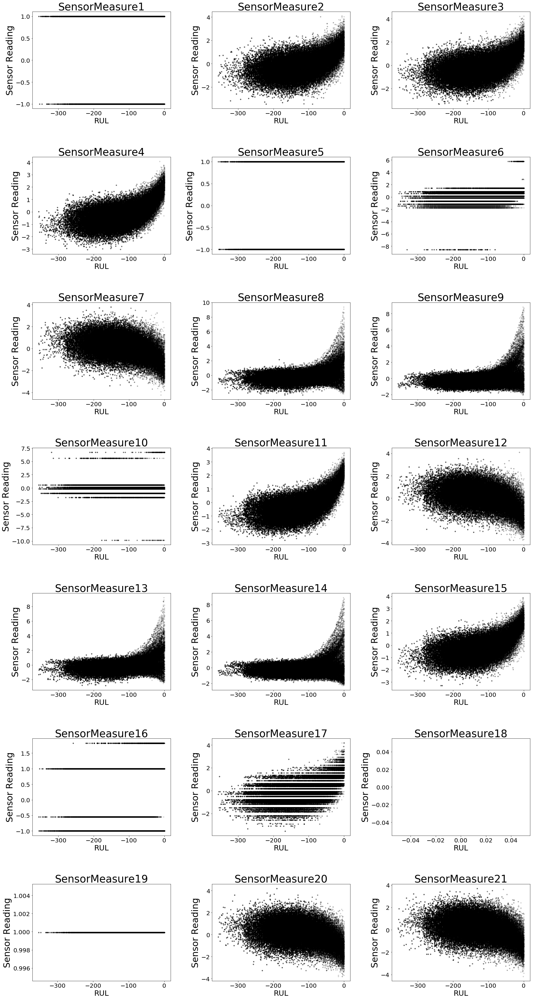

In [230]:
## Plot the standarized sensors

fig,ax=plt.subplots(7,3,figsize=(30,60))
c=0
for i in range(0,7):
    for j in range(0,3):
        plt.subplots_adjust(wspace=0.3, hspace=0.5)
        ax[i,j].scatter(df_standarized['t_minus'], df_standarized['SensorMeasure'+str(c+1)],s=10,alpha=0.15, color = 'black')
        ax[i,j].set_title('SensorMeasure'+str(c+1), fontsize = 35)
        ax[i,j].set_xlabel("RUL", fontsize = 25)
        ax[i,j].set_ylabel("Sensor Reading", fontsize = 30)
        ax[i,j].tick_params(axis='both', labelsize=20)
        c+=1
hide()

In [231]:
## Drop useless sensors

df_standarized = df_standarized.drop('SensorMeasure1', 1)
df_standarized = df_standarized.drop('SensorMeasure5', 1)
df_standarized = df_standarized.drop('SensorMeasure6', 1)
df_standarized = df_standarized.drop('SensorMeasure10', 1)
df_standarized = df_standarized.drop('SensorMeasure16', 1)
df_standarized = df_standarized.drop('SensorMeasure17', 1)
df_standarized = df_standarized.drop('SensorMeasure18', 1)
df_standarized = df_standarized.drop('SensorMeasure19', 1)


# Separate sensors by group

sensor_a = pd.concat([df_standarized['SensorMeasure2'], df_standarized['SensorMeasure3'], df_standarized['SensorMeasure4'], df_standarized['SensorMeasure11'], df_standarized['SensorMeasure15']], axis=1)
sensor_b = pd.concat([df_standarized['SensorMeasure7'], df_standarized['SensorMeasure12'], df_standarized['SensorMeasure20'], df_standarized['SensorMeasure21']], axis=1)
sensor_c = pd.concat([df_standarized['SensorMeasure8'], df_standarized['SensorMeasure9'], df_standarized['SensorMeasure13'], df_standarized['SensorMeasure14']], axis=1)

In [232]:
# Outlier work

limit = 4

z_a = np.abs(stats.zscore(sensor_a))
new_a = sensor_a[(z_a < limit).all(axis=1)]
find_a = pd.DataFrame(np.where(z_a >= limit))
find_a = find_a.T
unique_removed_rows_a = find_a[0].unique()

z_b = np.abs(stats.zscore(sensor_b))
new_b = sensor_b[(z_b < limit).all(axis=1)]
find_b = pd.DataFrame(np.where(z_b >= limit))
find_b = find_b.T
unique_removed_rows_b = find_b[0].unique()

z_c = np.abs(stats.zscore(sensor_c))
new_c = sensor_c[(z_c < limit).all(axis=1)]
find_c = pd.DataFrame(np.where(z_c >= limit))
find_c = find_c.T
unique_removed_rows_c = find_c[0].unique()

print('Sensor A, outliers detected: ', unique_removed_rows_a.shape[0])
print('Sensor B, outliers detected: ', unique_removed_rows_b.shape[0])
print('Sensor C, outliers detected: ', unique_removed_rows_c.shape[0])



# Convert arrays to data frames
unique_removed_rows_a = pd.DataFrame(unique_removed_rows_a)
unique_removed_rows_b = pd.DataFrame(unique_removed_rows_b)
unique_removed_rows_c = pd.DataFrame(unique_removed_rows_c)

# Concatenate them
unique_removed_rows = pd.concat([unique_removed_rows_a, unique_removed_rows_b, unique_removed_rows_c])

# Drop repeated values
unique_removed_rows = unique_removed_rows[0].unique()

# Create a new DataFrame from the training set sensors without the outliers rows
new_df = df_standarized.iloc[:,:13]
new_df = new_df.drop(unique_removed_rows)



print('\n\n\nTotal of removed samples: ', unique_removed_rows.shape[0])
print('Previous number of samples: ', df_train.shape[0])
print('New number of samples: ', new_df.shape[0])
print('Just for checking: ', len(df_train), '-', len(new_df), ' = ', len(df_train)-len(new_df))
print('Percentage removed: ', (unique_removed_rows.shape[0]/df_train.shape[0])*100, '%')




# RECONSTRUCTING DATA AFTER OUTLIER REMOVER

# Recalculating removed samples per test

removed_tests = df_train.ix[unique_removed_rows] # get rows to be removed from original training set
count = [] # this list will further receive the number of removed samples from each test 
cob = 0
for i in range(1, df_train['UnitNumber'].max()+1):
    for j in removed_tests.index:
        if (removed_tests['UnitNumber'][j] == i):
            cob = cob + 1
    count.append(cob)
    cob = 0
count = np.array(count)
new_rul_unitno = artificial_rul_unitno - count # this new variable holds the new total operation time from each test


# Recreate T_minus 

idx = []
for i in range(0,df_train['UnitNumber'].max()):
    big = int(new_rul_unitno[i])
    for j in range(-big+1, 1):
        idx.append(j)
idx = pd.DataFrame(idx)
idx.columns = (['t_minus'])


# Recreate the "unit_no" column

unitt = []
for i in range(1,df_train['UnitNumber'].max()+1):
    big2 = new_rul_unitno[i-1]
    for j in range(0, big2):
        unitt.append(i)
unitt = pd.DataFrame(unitt)
unitt.columns = (['unit'])


# Merge and rename columns

new_df = new_df.reset_index(drop=True)
new_df = pd.concat([unitt, idx, new_df], axis=1)
columnsTitles=["unit", "t_minus", "SensorMeasure2", "SensorMeasure3", "SensorMeasure4", "SensorMeasure11", "SensorMeasure15", "SensorMeasure7", "SensorMeasure12", "SensorMeasure20", "SensorMeasure21", "SensorMeasure8", "SensorMeasure9", "SensorMeasure13", "SensorMeasure14"]
new_df = new_df.reindex(columns=columnsTitles)

Sensor A, outliers detected:  172
Sensor B, outliers detected:  45
Sensor C, outliers detected:  1696



Total of removed samples:  1845
Previous number of samples:  155664
New number of samples:  153819
Just for checking:  155664 - 153819  =  1845
Percentage removed:  1.185245143385754 %


C:\Users\Usuario\Anaconda2\lib\site-packages\ipykernel_launcher.py:59: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated


We quintupled our number of tests but the behavior remains consistent, we detected almost the same percentage of outliers for the artificial training set

Check point 2: Violin plot after filtering

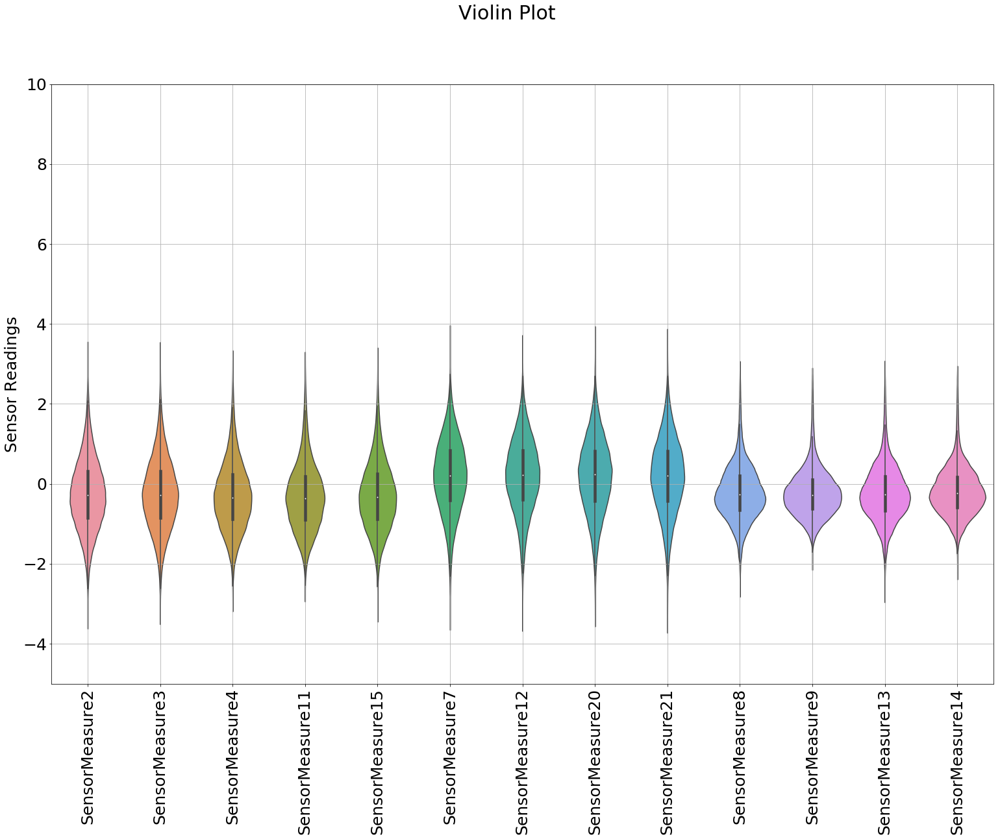

In [233]:
fig, ax = pyplot.subplots(figsize =(26, 17)) 
sns.violinplot(ax = ax,  data = new_df.iloc[:, 2:])
plt.suptitle('Violin Plot', fontsize = 30)
plt.ylabel('Sensor Readings', fontsize = 25)
plt.xticks(rotation = 90)
plt.tick_params(axis='both', labelsize=25)
plt.ylim(-5, 10)
#plt.yticks(labelsize = 25)
plt.grid()
hide()

In [234]:
## Load PCA transformation matrixes from original training set

pca_matrix_a = np.load('saved_statistics/pca_matrix_a.npy')
pca_matrix_b = np.load('saved_statistics/pca_matrix_b.npy')
pca_matrix_c = np.load('saved_statistics/pca_matrix_c.npy')

# Load original PCA statistics

PCA_a_orig = pd.read_csv('saved_statistics/ICA_a.csv', header=None)
PCA_a_orig = PCA_a_orig.drop(PCA_a_orig.columns[[0]], axis=1)
PCA_b_orig = pd.read_csv('saved_statistics/ICA_b.csv', header=None)
PCA_b_orig = PCA_b_orig.drop(PCA_b_orig.columns[[0]], axis=1)
PCA_c_orig = pd.read_csv('saved_statistics/ICA_c.csv', header=None)
PCA_c_orig = PCA_c_orig.drop(PCA_c_orig.columns[[0]], axis=1)

In [235]:
## Perform the PCA to the new sets

sensor_a = np.array(new_df.iloc[:, 2:7])
PCA_a = np.matmul(sensor_a, pca_matrix_a)
PCA_a = pd.DataFrame(PCA_a)
PCA_a = pd.concat([PCA_a, new_df['unit']], axis=1)
PCA_a.columns = (['value', 'unit'])
PCA_a = PCA_a.set_index(new_df['t_minus'])

sensor_b = np.array(new_df.iloc[:, 7:11])
PCA_b = np.matmul(sensor_b, pca_matrix_b)
PCA_b = pd.DataFrame(PCA_b)
PCA_b = pd.concat([PCA_b, new_df['unit']], axis=1)
PCA_b.columns = (['value', 'unit'])
PCA_b = PCA_b.set_index(new_df['t_minus'])

sensor_c = np.array(new_df.iloc[:, 11:])
PCA_c = np.matmul(sensor_c, pca_matrix_c)
PCA_c = pd.DataFrame(PCA_c)
PCA_c = pd.concat([PCA_c, new_df['unit']], axis=1)
PCA_c.columns = (['value', 'unit'])
PCA_c = PCA_c.set_index(new_df['t_minus'])



## Standarize new three PCA sensors

PCA_a['value'] = (PCA_a['value'] - PCA_a_orig[1].mean())/PCA_a_orig[1].std()
PCA_b['value'] = (PCA_b['value'] - PCA_b_orig[1].mean())/PCA_b_orig[1].std()
PCA_c['value'] = (PCA_c['value'] - PCA_c_orig[1].mean())/PCA_c_orig[1].std()

In [236]:
# Log_transform

min_a = abs(PCA_a_orig[1].min())
jow_a = PCA_a['value'] + min_a
jow_a = pd.DataFrame(jow_a)
df_log_a = jow_a.applymap(lambda x: np.log(x+1))

min_b = abs(PCA_b_orig[1].min())
jow_b = PCA_b['value'] + min_b
jow_b = pd.DataFrame(jow_b)
df_log_b = jow_b.applymap(lambda x: np.log(x+1))

min_c = abs(PCA_c_orig[1].min())
jow_c = PCA_c['value'] + min_c
jow_c = pd.DataFrame(jow_c)
df_log_c = jow_c.applymap(lambda x: np.log(x+1))

df_log = pd.concat([PCA_a['unit'], df_log_a, df_log_b, df_log_c], axis=1)
df_log['time'] = df_log.index
df_log = df_log.reset_index(drop=True)
df_log.columns = (['unit', 'sensor_a', 'sensor_b', 'sensor_c', 'time'])
columnsNewTitles=["time", "unit", "sensor_a", "sensor_b", "sensor_c"]
df_log = df_log.reindex(columns=columnsNewTitles)

Check point 3: Sensor C as exemple of last data format before the Feature Extraction step

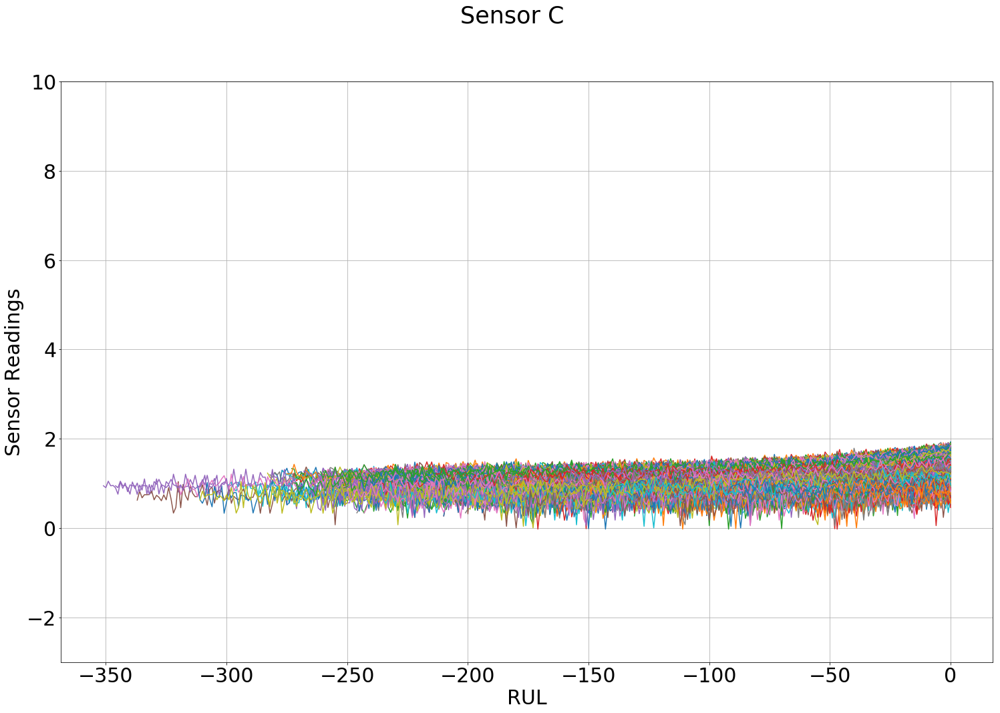

In [239]:
# Sensor C

fig = plt.figure(figsize=(25,16))
plt.suptitle('Sensor C', fontsize = 35)
plt.xlabel('RUL', fontsize = 30)
plt.ylabel('Sensor Readings', fontsize = 30)
plt.tick_params(axis='both', labelsize=30)
plt.ylim(-3, 10)
for i in range(1,df_log['unit'].max()+1):
    plt.plot(df_log['time'][df_log['unit'] == i], df_log['sensor_a'][df_log['unit'] == i])
plt.grid()
plt.show()
hide()

In [241]:
print('Number of tests: ', df_log['unit'].max())
print('number of labels: ', labels.shape[0])
df_log.head()

Number of tests:  1090
number of labels:  1090


,time,unit,sensor_a,sensor_b,sensor_c
0,-221,1,0.989018,1.090224,1.056621
1,-220,1,0.837046,1.146392,1.157450
2,-219,1,1.151960,1.305502,1.135352
3,-218,1,1.086793,1.253211,1.015644
4,-217,1,0.881096,1.096993,1.167750


# Step 8. Feature extraction and selection

In [242]:
# FEATURES EXTRACTION

features_filtered_direct = extract_relevant_features(df_log, labels,
                                                     column_id='unit', column_sort='time')

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 10/10 [12:36<00:00, 62.66s/it]


In [274]:
print('features shape: ', features_filtered_direct.shape)
print('labels shape: ', labels.shape)

features shape:  (1090, 1137)
labels shape:  (1090,)


# 9. Training and evaluation models

In [244]:
xTrain, xTest, yTrain, yTest = train_test_split(features_filtered_direct, labels, test_size = 0.2, random_state = 0)

xTrain = np.array(xTrain)
yTrain = np.array(yTrain).reshape((-1))
xTest = np.array(xTest)
yTest = np.array(yTest).reshape((-1))

print('Data Shape: \n')
print('train_set: ', xTrain.shape)
print('y_train: ', yTrain.shape)
print('test_set: ', xTest.shape)
print('y_test: ', yTest.shape)
hide()

Data Shape: 

train_set:  (872, 1137)
y_train:  (872,)
test_set:  (218, 1137)
y_test:  (218,)


We must remember that the test results may vary due to the fact that artificial training sets are created according to predetermined __INTERVALS__, and as these intervals may vary, artificial tests are never the same, consequently, the results tend to have slight variations.

#### Extreme Gradient Boosting

In [262]:
# Train the model

xgb_model = xgb.XGBRegressor()
xgb_model.fit(xTrain, yTrain)
output = xgb_model.predict(xTest)

[15:32:29] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


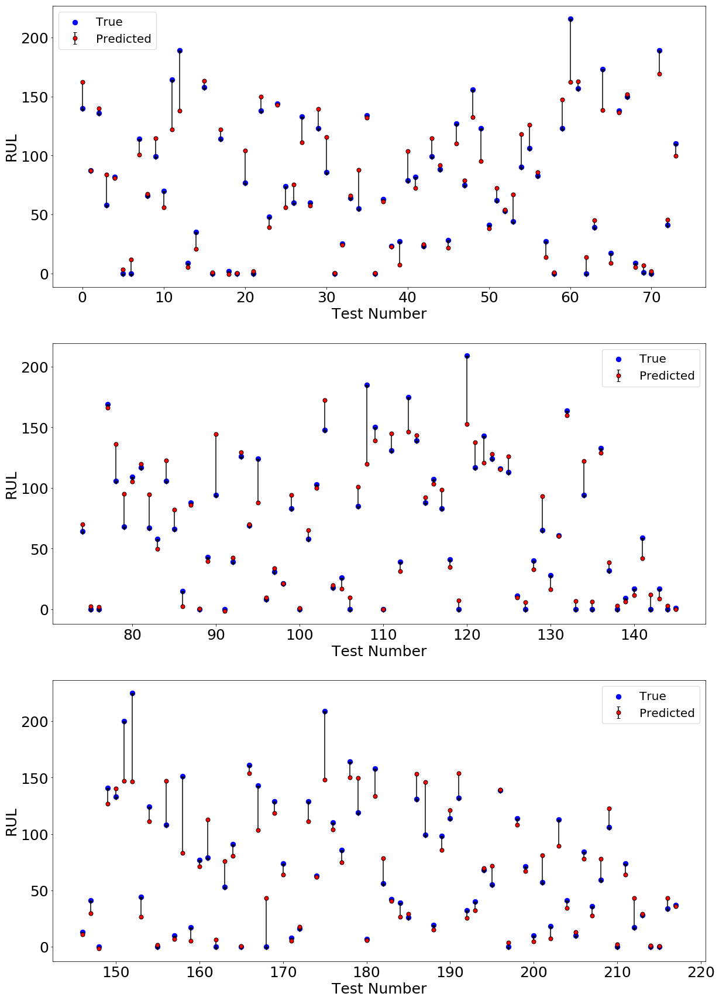

In [263]:
pred = pd.DataFrame(output)
orig = pd.DataFrame(yTest)
data = pd.concat([orig, pred], axis=1)
data.columns = (['True', 'Predicted'])
data['Error'] = data['Predicted'] - data['True']

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(20,30))
fig.subplots_adjust(hspace=0.2)
plt.legend(loc='upper right', fontsize = 30)

ax1.scatter(data.index[:74], data['True'][:74], color='blue', s=70)
ax1.errorbar(data.index[:74], data['Predicted'][:74], yerr=data['Error'][:74], fmt='.k', marker='o', ms=7, mfc='red',
            uplims=True)
ax1.tick_params(axis='both', labelsize=25)
ax1.set_xlabel('Test Number', fontsize = 25)
ax1.set_ylabel('RUL', fontsize = 25)
ax1.legend(loc="upper left", fontsize = 20)


ax2.scatter(data.index[74:146], data['True'][74:146], color='blue', s=70)
ax2.errorbar(data.index[74:146], data['Predicted'][74:146], yerr=data['Error'][74:146], fmt='.k', marker='o', ms=7, mfc='red',
            uplims=True)
ax2.tick_params(axis='both', labelsize=25)
ax2.set_xlabel('Test Number', fontsize = 25)
ax2.set_ylabel('RUL', fontsize = 25)
ax2.legend(loc="upper right", fontsize = 20)


ax3.scatter(data.index[146:], data['True'][146:], color='blue', s=70)
ax3.errorbar(data.index[146:], data['Predicted'][146:], yerr=data['Error'][146:], fmt='.k', marker='o', ms=7, mfc='red',
            uplims=True)
ax3.tick_params(axis='both', labelsize=25)
ax3.set_xlabel('Test Number', fontsize = 25)
ax3.set_ylabel('RUL', fontsize = 25)
ax3.legend(loc="upper right", fontsize = 20)

In [264]:
print('\n\n\n\nAmount of predicted values: ', output.shape)
result = evaluation(output, yTest)





Amount of predicted values:  (218,)
Negative predictions:  5
Score:  2098.5278127907977
AVG Score per test:  9.62627437059999


#### Decision Tree

In [265]:
# Train the model

decision_tree_model = DecisionTreeRegressor()  
decision_tree_model.fit(xTrain, yTrain)
output = decision_tree_model.predict(xTest)

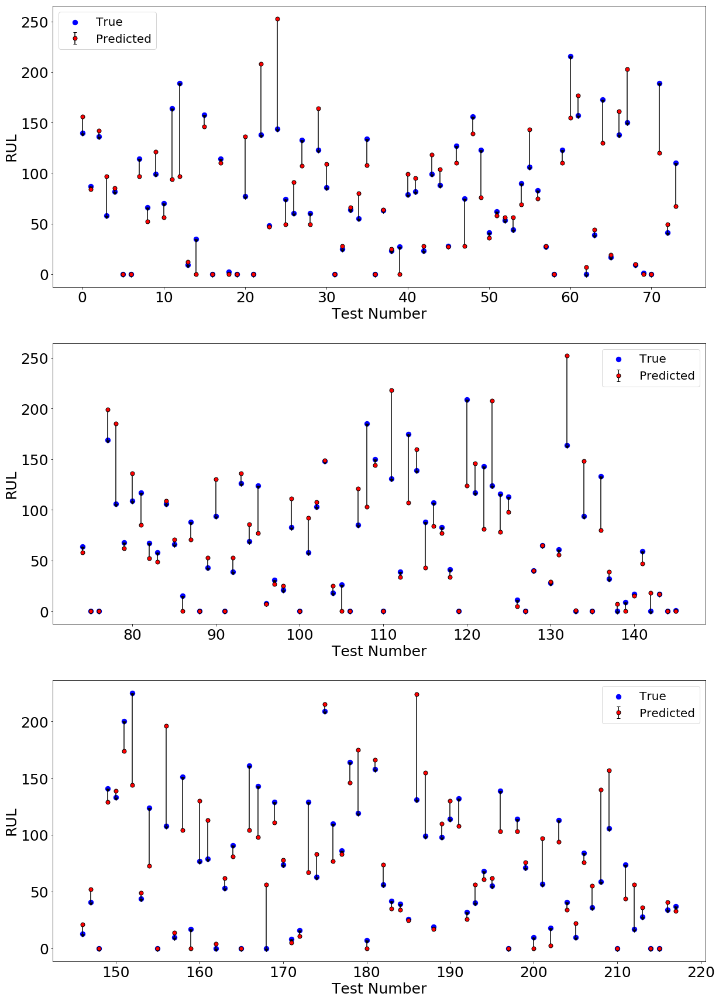

In [266]:
pred = pd.DataFrame(output)
orig = pd.DataFrame(yTest)
data = pd.concat([orig, pred], axis=1)
data.columns = (['True', 'Predicted'])
data['Error'] = data['Predicted'] - data['True']

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(20,30))
fig.subplots_adjust(hspace=0.2)
plt.legend(loc='upper right', fontsize = 30)

ax1.scatter(data.index[:74], data['True'][:74], color='blue', s=70)
ax1.errorbar(data.index[:74], data['Predicted'][:74], yerr=data['Error'][:74], fmt='.k', marker='o', ms=7, mfc='red',
            uplims=True)
ax1.tick_params(axis='both', labelsize=25)
ax1.set_xlabel('Test Number', fontsize = 25)
ax1.set_ylabel('RUL', fontsize = 25)
ax1.legend(loc="upper left", fontsize = 20)


ax2.scatter(data.index[74:146], data['True'][74:146], color='blue', s=70)
ax2.errorbar(data.index[74:146], data['Predicted'][74:146], yerr=data['Error'][74:146], fmt='.k', marker='o', ms=7, mfc='red',
            uplims=True)
ax2.tick_params(axis='both', labelsize=25)
ax2.set_xlabel('Test Number', fontsize = 25)
ax2.set_ylabel('RUL', fontsize = 25)
ax2.legend(loc="upper right", fontsize = 20)


ax3.scatter(data.index[146:], data['True'][146:], color='blue', s=70)
ax3.errorbar(data.index[146:], data['Predicted'][146:], yerr=data['Error'][146:], fmt='.k', marker='o', ms=7, mfc='red',
            uplims=True)
ax3.tick_params(axis='both', labelsize=25)
ax3.set_xlabel('Test Number', fontsize = 25)
ax3.set_ylabel('RUL', fontsize = 25)
ax3.legend(loc="upper right", fontsize = 20)

In [267]:
print('\n\n\n\nAmount of predicted values: ', output.shape)
result = evaluation(output, yTest)





Amount of predicted values:  (218,)
Negative predictions:  0
Score:  102993.62446145168
AVG Score per test:  472.4478186305123


#### SVM Radial Kernel

In [268]:
# Train the model

svm_model = SVR(kernel='rbf')
svm_model.fit(xTrain, yTrain)
output = svm_model.predict(xTest)

C:\Users\Usuario\Anaconda2\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


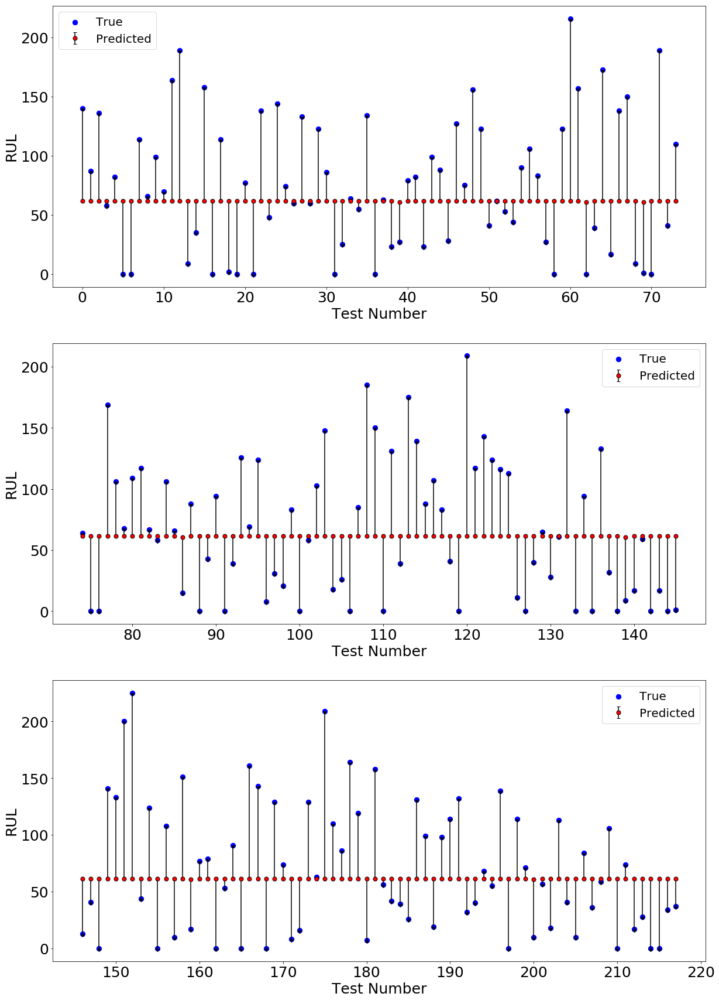

In [269]:
pred = pd.DataFrame(output)
orig = pd.DataFrame(yTest)
data = pd.concat([orig, pred], axis=1)
data.columns = (['True', 'Predicted'])
data['Error'] = data['Predicted'] - data['True']

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(20,30))
fig.subplots_adjust(hspace=0.2)
plt.legend(loc='upper right', fontsize = 30)

ax1.scatter(data.index[:74], data['True'][:74], color='blue', s=70)
ax1.errorbar(data.index[:74], data['Predicted'][:74], yerr=data['Error'][:74], fmt='.k', marker='o', ms=7, mfc='red',
            uplims=True)
ax1.tick_params(axis='both', labelsize=25)
ax1.set_xlabel('Test Number', fontsize = 25)
ax1.set_ylabel('RUL', fontsize = 25)
ax1.legend(loc="upper left", fontsize = 20)


ax2.scatter(data.index[74:146], data['True'][74:146], color='blue', s=70)
ax2.errorbar(data.index[74:146], data['Predicted'][74:146], yerr=data['Error'][74:146], fmt='.k', marker='o', ms=7, mfc='red',
            uplims=True)
ax2.tick_params(axis='both', labelsize=25)
ax2.set_xlabel('Test Number', fontsize = 25)
ax2.set_ylabel('RUL', fontsize = 25)
ax2.legend(loc="upper right", fontsize = 20)


ax3.scatter(data.index[146:], data['True'][146:], color='blue', s=70)
ax3.errorbar(data.index[146:], data['Predicted'][146:], yerr=data['Error'][146:], fmt='.k', marker='o', ms=7, mfc='red',
            uplims=True)
ax3.tick_params(axis='both', labelsize=25)
ax3.set_xlabel('Test Number', fontsize = 25)
ax3.set_ylabel('RUL', fontsize = 25)
ax3.legend(loc="upper right", fontsize = 20)

In [270]:
print('\n\n\n\nAmount of predicted values: ', output.shape)
result = evaluation(output, yTest)





Amount of predicted values:  (218,)
Negative predictions:  0
Score:  752971.2641622359
AVG Score per test:  3453.9966245974124


#### Random Forest

In [271]:
# Training the model

random_forest_model = RandomForestRegressor(n_estimators = 100, random_state = 0) 
random_forest_model.fit(xTrain, yTrain)
output = random_forest_model.predict(xTest)

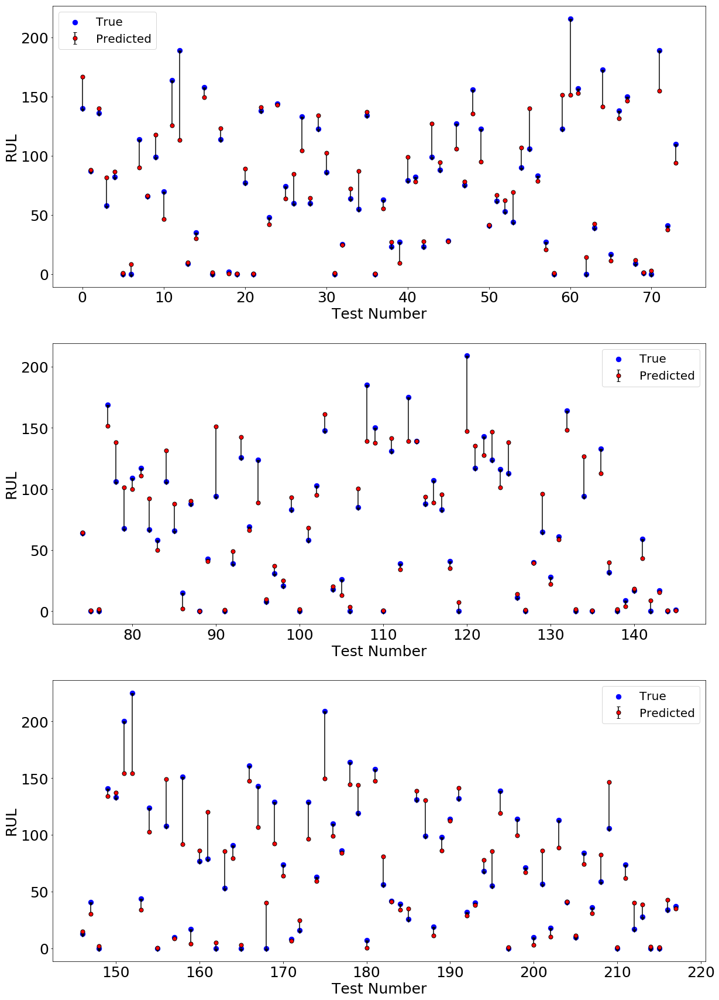

In [272]:
pred = pd.DataFrame(output)
orig = pd.DataFrame(yTest)
data = pd.concat([orig, pred], axis=1)
data.columns = (['True', 'Predicted'])
data['Error'] = data['Predicted'] - data['True']

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(20,30))
fig.subplots_adjust(hspace=0.2)
plt.legend(loc='upper right', fontsize = 30)

ax1.scatter(data.index[:74], data['True'][:74], color='blue', s=70)
ax1.errorbar(data.index[:74], data['Predicted'][:74], yerr=data['Error'][:74], fmt='.k', marker='o', ms=7, mfc='red',
            uplims=True)
ax1.tick_params(axis='both', labelsize=25)
ax1.set_xlabel('Test Number', fontsize = 25)
ax1.set_ylabel('RUL', fontsize = 25)
ax1.legend(loc="upper left", fontsize = 20)


ax2.scatter(data.index[74:146], data['True'][74:146], color='blue', s=70)
ax2.errorbar(data.index[74:146], data['Predicted'][74:146], yerr=data['Error'][74:146], fmt='.k', marker='o', ms=7, mfc='red',
            uplims=True)
ax2.tick_params(axis='both', labelsize=25)
ax2.set_xlabel('Test Number', fontsize = 25)
ax2.set_ylabel('RUL', fontsize = 25)
ax2.legend(loc="upper right", fontsize = 20)


ax3.scatter(data.index[146:], data['True'][146:], color='blue', s=70)
ax3.errorbar(data.index[146:], data['Predicted'][146:], yerr=data['Error'][146:], fmt='.k', marker='o', ms=7, mfc='red',
            uplims=True)
ax3.tick_params(axis='both', labelsize=25)
ax3.set_xlabel('Test Number', fontsize = 25)
ax3.set_ylabel('RUL', fontsize = 25)
ax3.legend(loc="upper right", fontsize = 20)

In [273]:
print('\n\n\n\nAmount of predicted values: ', output.shape)
result = evaluation(output, yTest)





Amount of predicted values:  (218,)
Negative predictions:  0
Score:  2347.0292252926715
AVG Score per test:  10.766189106847117


<br><br>
Looking after these scatter plots we can see that the XGBoost and Random Forest algorithms stand out, the predictions are clearly closer to the real RUL. We can also observe that the tests with less RUL had more accurate predictions.

However, it is difficult and meaningless to define which one performed best through these graphics.
As an accurate evaluation method, we also used the evaluation equation itself provided by the competition. Its function is defined at the beginning of the code, its name is: evaluation.

So looking at the numerical results defined as "score", we can see that the Decision Tree and SVM algorithms obtained catastrophic results. XGBoost and Random Forest algorithms have yielded reasonable enough results to claim that the method works.
<br><br>

Alright, as our best result is from XGBoost, let's train all data with this algorithm and then we have our final trained model for our goal: predict the RUL's for the test set.

In [277]:
final_train = np.array(features_filtered_direct)
xgb_model = xgb.XGBRegressor()
xgb_model.fit(final_train, labels)
print(xgb_model)

[15:46:15] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1)


# PART3 - Test Set

In [318]:
df_test = pd.read_csv('original_data/test.txt',delim_whitespace=True, names=input_file_column_names)
rul_unitno=[max(df_test.query('UnitNumber=='+str(i)).Cycle) for i in range(1,219)]
t_minus_temp=[df_test.query('UnitNumber=='+str(i)).Cycle.values-rul_unitno[i-1] for i in range(1,219)]
t_minus_list=[j for i in t_minus_temp for j in i]
df_test=df_test.assign(t_minus=t_minus_list)
print(df_test.shape)

(29820, 27)


In [319]:
# Clustering

new_cluster = kmeans_cluster(centroids_train, df_test.iloc[:,2:5])
df_test = pd.concat([df_test, new_cluster], axis=1)
df_test = df_test.rename(columns = {0:'cluster'})


# Standarize

std_test0 = df_test.iloc[:,5:26][df_test['cluster'] == 0]
std_test1 = df_test.iloc[:,5:26][df_test['cluster'] == 1]
std_test2 = df_test.iloc[:,5:26][df_test['cluster'] == 2]
std_test3 = df_test.iloc[:,5:26][df_test['cluster'] == 3]
std_test4 = df_test.iloc[:,5:26][df_test['cluster'] == 4]
std_test5 = df_test.iloc[:,5:26][df_test['cluster'] == 5]

std_test0 = (std_test0 - df0.mean())/df0.std()
std_test1 = (std_test1 - df1.mean())/df1.std()
std_test2 = (std_test2 - df2.mean())/df2.std()
std_test3 = (std_test3 - df3.mean())/df3.std()
std_test4 = (std_test4 - df4.mean())/df4.std()
std_test5 = (std_test5 - df5.mean())/df5.std()

df_standarized = pd.concat([std_test0, std_test1, std_test2, std_test3, std_test4, std_test5])
df_standarized = df_standarized.sort_index()
df_standarized = pd.concat([df_standarized, df_test['t_minus']], axis=1)


## Drop useless sensors

df_standarized = df_standarized.drop('SensorMeasure1', 1)
df_standarized = df_standarized.drop('SensorMeasure5', 1)
df_standarized = df_standarized.drop('SensorMeasure6', 1)
df_standarized = df_standarized.drop('SensorMeasure10', 1)
df_standarized = df_standarized.drop('SensorMeasure16', 1)
df_standarized = df_standarized.drop('SensorMeasure17', 1)
df_standarized = df_standarized.drop('SensorMeasure18', 1)
df_standarized = df_standarized.drop('SensorMeasure19', 1)


# Separate sensors by group

sensor_a = pd.concat([df_standarized['SensorMeasure2'], df_standarized['SensorMeasure3'], df_standarized['SensorMeasure4'], df_standarized['SensorMeasure11'], df_standarized['SensorMeasure15']], axis=1)
sensor_b = pd.concat([df_standarized['SensorMeasure7'], df_standarized['SensorMeasure12'], df_standarized['SensorMeasure20'], df_standarized['SensorMeasure21']], axis=1)
sensor_c = pd.concat([df_standarized['SensorMeasure8'], df_standarized['SensorMeasure9'], df_standarized['SensorMeasure13'], df_standarized['SensorMeasure14']], axis=1)


# Outlier work

limit = 4

z_a = np.abs(stats.zscore(sensor_a))
new_a = sensor_a[(z_a < limit).all(axis=1)]
find_a = pd.DataFrame(np.where(z_a >= limit))
find_a = find_a.T
unique_removed_rows_a = find_a[0].unique()

z_b = np.abs(stats.zscore(sensor_b))
new_b = sensor_b[(z_b < limit).all(axis=1)]
find_b = pd.DataFrame(np.where(z_b >= limit))
find_b = find_b.T
unique_removed_rows_b = find_b[0].unique()

z_c = np.abs(stats.zscore(sensor_c))
new_c = sensor_c[(z_c < limit).all(axis=1)]
find_c = pd.DataFrame(np.where(z_c >= limit))
find_c = find_c.T
unique_removed_rows_c = find_c[0].unique()

print('Sensor A, outliers detected: ', unique_removed_rows_a.shape[0])
print('Sensor B, outliers detected: ', unique_removed_rows_b.shape[0])
print('Sensor C, outliers detected: ', unique_removed_rows_c.shape[0])



# Convert arrays to data frames
unique_removed_rows_a = pd.DataFrame(unique_removed_rows_a)
unique_removed_rows_b = pd.DataFrame(unique_removed_rows_b)
unique_removed_rows_c = pd.DataFrame(unique_removed_rows_c)

# Concatenate them
unique_removed_rows = pd.concat([unique_removed_rows_a, unique_removed_rows_b, unique_removed_rows_c])

# Drop repeated values
unique_removed_rows = unique_removed_rows[0].unique()

# Create a new DataFrame from the training set sensors without the outliers rows
new_df = df_standarized.iloc[:,:13]
new_df = new_df.drop(unique_removed_rows)



print('\n\n\nTotal of removed samples: ', unique_removed_rows.shape[0])
print('Previous number of samples: ', df_test.shape[0])
print('New number of samples: ', new_df.shape[0])
print('Just for checking: ', len(df_test), '-', len(new_df), ' = ', len(df_test)-len(new_df))
print('Percentage removed: ', (unique_removed_rows.shape[0]/df_test.shape[0])*100, '%')



# RECONSTRUCTING DATA AFTER OUTLIER REMOVER

# Recalculating removed samples per test

removed_tests = df_test.ix[unique_removed_rows] # get rows to be removed from original training set
count = [] # this list will further receive the number of removed samples from each test 
cob = 0
for i in range(1, df_test['UnitNumber'].max()+1):
    for j in removed_tests.index:
        if (removed_tests['UnitNumber'][j] == i):
            cob = cob + 1
    count.append(cob)
    cob = 0
count = np.array(count)
new_rul_unitno = rul_unitno - count # this new variable holds the new total operation time from each test


# Recreate T_minus 

idx = []
for i in range(0,df_test['UnitNumber'].max()):
    big = int(new_rul_unitno[i])
    for j in range(-big+1, 1):
        idx.append(j)
idx = pd.DataFrame(idx)
idx.columns = (['t_minus'])


# Recreate the "unit_no" column

unitt = []
for i in range(1,df_test['UnitNumber'].max()+1):
    big2 = new_rul_unitno[i-1]
    for j in range(0, big2):
        unitt.append(i)
unitt = pd.DataFrame(unitt)
unitt.columns = (['unit'])


# Merge and rename columns

new_df = new_df.reset_index(drop=True)
new_df = pd.concat([unitt, idx, new_df], axis=1)
columnsTitles=["unit", "t_minus", "SensorMeasure2", "SensorMeasure3", "SensorMeasure4", "SensorMeasure11", "SensorMeasure15", "SensorMeasure7", "SensorMeasure12", "SensorMeasure20", "SensorMeasure21", "SensorMeasure8", "SensorMeasure9", "SensorMeasure13", "SensorMeasure14"]
new_df = new_df.reindex(columns=columnsTitles)


## Perform the PCA to the new sets

sensor_a = np.array(new_df.iloc[:, 2:7])
PCA_a = np.matmul(sensor_a, pca_matrix_a)
PCA_a = pd.DataFrame(PCA_a)
PCA_a = pd.concat([PCA_a, new_df['unit']], axis=1)
PCA_a.columns = (['value', 'unit'])
PCA_a = PCA_a.set_index(new_df['t_minus'])

sensor_b = np.array(new_df.iloc[:, 7:11])
PCA_b = np.matmul(sensor_b, pca_matrix_b)
PCA_b = pd.DataFrame(PCA_b)
PCA_b = pd.concat([PCA_b, new_df['unit']], axis=1)
PCA_b.columns = (['value', 'unit'])
PCA_b = PCA_b.set_index(new_df['t_minus'])

sensor_c = np.array(new_df.iloc[:, 11:])
PCA_c = np.matmul(sensor_c, pca_matrix_c)
PCA_c = pd.DataFrame(PCA_c)
PCA_c = pd.concat([PCA_c, new_df['unit']], axis=1)
PCA_c.columns = (['value', 'unit'])
PCA_c = PCA_c.set_index(new_df['t_minus'])



## Standarize new three PCA sensors

PCA_a['value'] = (PCA_a['value'] - PCA_a_orig[1].mean())/PCA_a_orig[1].std()
PCA_b['value'] = (PCA_b['value'] - PCA_b_orig[1].mean())/PCA_b_orig[1].std()
PCA_c['value'] = (PCA_c['value'] - PCA_c_orig[1].mean())/PCA_c_orig[1].std()


# Log_transform

min_a = abs(PCA_a_orig[1].min())
jow_a = PCA_a['value'] + min_a
jow_a = pd.DataFrame(jow_a)
df_log_a = jow_a.applymap(lambda x: np.log(x+1))

min_b = abs(PCA_b_orig[1].min())
jow_b = PCA_b['value'] + min_b
jow_b = pd.DataFrame(jow_b)
df_log_b = jow_b.applymap(lambda x: np.log(x+1))

min_c = abs(PCA_c_orig[1].min())
jow_c = PCA_c['value'] + min_c
jow_c = pd.DataFrame(jow_c)
df_log_c = jow_c.applymap(lambda x: np.log(x+1))

df_log = pd.concat([PCA_a['unit'], df_log_a, df_log_b, df_log_c], axis=1)
df_log['time'] = df_log.index
df_log = df_log.reset_index(drop=True)
df_log.columns = (['unit', 'sensor_a', 'sensor_b', 'sensor_c', 'time'])
columnsNewTitles=["time", "unit", "sensor_a", "sensor_b", "sensor_c"]
df_log = df_log.reindex(columns=columnsNewTitles)

Sensor A, outliers detected:  16
Sensor B, outliers detected:  14
Sensor C, outliers detected:  310



Total of removed samples:  337
Previous number of samples:  29820
New number of samples:  29483
Just for checking:  29820 - 29483  =  337
Percentage removed:  1.1301140174379611 %


C:\Users\Usuario\Anaconda2\lib\site-packages\ipykernel_launcher.py:105: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated


In [320]:
df_log.head()

,time,unit,sensor_a,sensor_b,sensor_c
0,-53,1,1.277891,1.308191,1.187244
1,-52,1,1.215031,1.387132,0.706727
2,-51,1,1.277856,1.298857,1.365508
3,-50,1,1.230469,1.453486,1.205484
4,-49,1,1.281111,1.427039,1.215367


In [321]:
features_and_params = tsfresh.feature_extraction.settings.from_columns(features_filtered_direct)

In [322]:
test_features = extract_features(df_log, column_id="unit", column_sort="time", kind_to_fc_parameters=features_and_params)

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 10/10 [01:37<00:00,  8.22s/it]


Note below that the number of features extracted from the test set was slightly different from the training set. Although the above code requires that only features extracted from the training set be calculated for the test set, there was still a slight difference. The documentation was read but I really couldn't understand why it happened. I remain open to suggestions and hypotheses about this issue.

In [323]:
test_features.shape

(218, 1139)

In [324]:
features_filtered_direct.shape

(1090, 1137)

At this point we will have to manually correct the difference between calculated features

In [325]:
train_features_list = features_filtered_direct.columns.tolist()
test_features_list = test_features.columns.tolist()
list(set(test_features_list) - set(train_features_list))

['sensor_b__friedrich_coefficients__m_3__r_30__coeff_2',
 'sensor_b__friedrich_coefficients__m_3__r_30__coeff_3']

In [326]:
list(set(train_features_list) - set(test_features_list))

[]

__IMPORTANT__<br>
If you are trying to reproduce this work, keep in mind that you should exclude in the code below exactly the features that are being displayed in the outputs of the two cells above!

In [327]:
test_features = test_features.drop('sensor_b__friedrich_coefficients__m_3__r_30__coeff_2', 1)
test_features = test_features.drop('sensor_b__friedrich_coefficients__m_3__r_30__coeff_3', 1)

In [328]:
# Re sort the columns according to the training set features
test_features = test_features[features_filtered_direct.columns]

# Turn it into an array
testing_set = np.array(test_features)

In [329]:
output = xgb_model.predict(data=testing_set)
print(output.shape)

(218,)


In [317]:
output = pd.DataFrame(output)
output.to_csv('result.txt', index=None, header=None)

By submitting the result on NASA's official website, we obtained the score of 2448.<br>
That would make us a little below the 20th place (18 points below).<br><br>

Thank you for following up here and if you have any suggestions or constructive criticism, I'm 100% open!<br><br>


__*Vitor Rosa*__